In [17]:
# importing some libraries we need in this part
import scipy.io
import numpy as np
import os
from collections import defaultdict, Counter
import pandas as pd
from matplotlib import pyplot as plt
import pickle
from cmath import pi
from scipy.interpolate import interp1d
from scipy.signal import find_peaks
from scipy.signal import stft
from scipy import signal
import numpy as np

---
## Breath estimation pipeline

In this section, the breath estimation pipeline is presented by using the first experiment as an example. It is worth noting that this is just a showcase of the breath estimation method which is conducted on a simple task, namely, only one user in the office to perform breathing with a 12 BMP breath rate. For the varied breath rate estimation and two-user mode, you need to consider more than this.

### Data loading

For the sake of completeness, we copy the data loading code in the first section to this block.

In [18]:
with open('Data/trainset.pickle', 'rb') as handle:
    trainset = pickle.load(handle)

CSI = trainset['CSI']
CSI_amplitude = np.abs(
    CSI[0])  # the amplitude of CSI series of the first experiment
CSI_phase = np.angle(CSI[0])  # the phase of CSI series of the first experiment

groundtruth = trainset['groundtruth'][
    0]  # loading the ground-truth of the first experiment
experiment_name = trainset['ex_name'][0][:-4]
print("the name of the first experiment: ", experiment_name)

the name of the first experiment:  breath_bpm12_ax200_cbw20_fs100_2x2_1_220928_163813


### Preprocessing

This step may contain denoise or data augmentation. Specifically, denoise is to eliminate the impact of random noise, and system noise (e.g., the outliers). If you want to use the phase of the CSI series to boost the performance of your breath detection model, you need to do the phase clean (a candidate method is that in the [WiDance](https://dl.acm.org/doi/abs/10.1145/3025453.3025678)). Data augmentation is a hot spot in the deep learning field, that is dedicated to strengthening the diversity, quantity, and quality of collected data. If you want to know about data augmentation methods in the WiFi sensing field, you can read the paper: [CsiGAN](https://ieeexplore.ieee.org/abstract/document/8808929). 

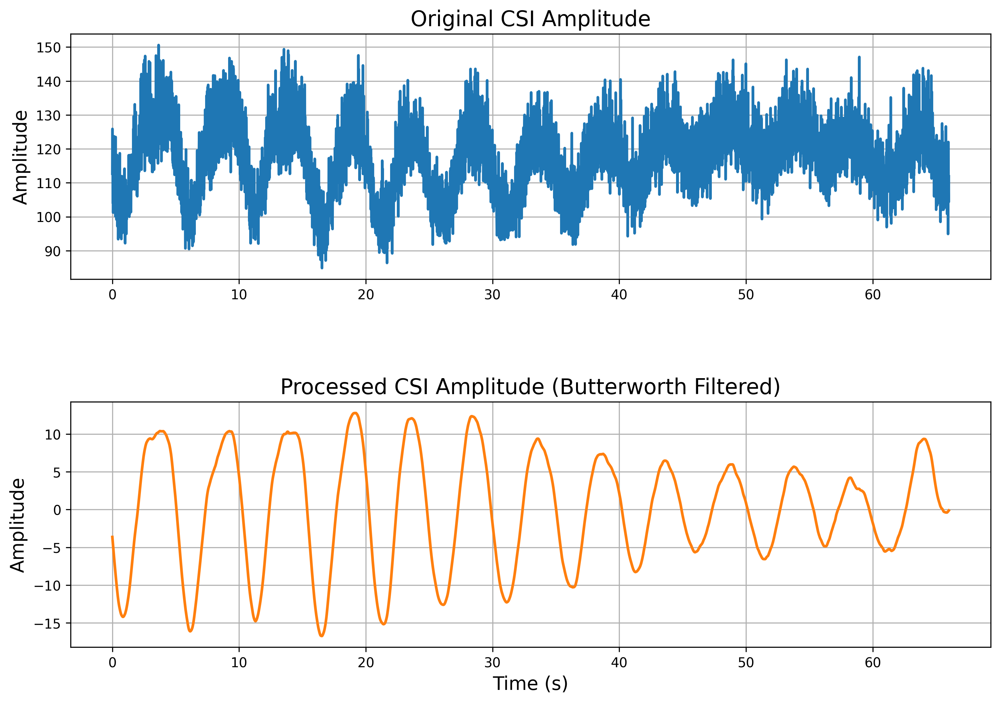

Visualization saved at: Visualization/csi_butterworth_filter_comparison.png


In [19]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import os

# Create directory for visualizations if it doesn't exist
output_dir = "Visualization/"
os.makedirs(output_dir, exist_ok=True)

# Butterworth Bandpass Filter parameters
# Breath rate for adults between 6 BPM (0.1 Hz) and 30 BPM (0.5 Hz)
# CSI sampling frequency is 100 Hz
b, a = signal.butter(1, [0.002, 0.01], 'bandpass')  # 1 is the order of the filter

# Selected parameters
selected_Rx = 0  # Selected Rx: 0 or 1
selected_Tx = 1  # Selected Tx: 0 or 1
selected_subcarrier = 15  # Selected subcarrier from 245 subcarriers
CSI_amp = CSI_amplitude[:, selected_subcarrier, selected_Rx, selected_Tx]

num_samples = CSI_amp.shape[0]  # The number of samples

# Apply the Butterworth bandpass filter
filted_CSI_amp = signal.filtfilt(b, a, CSI_amp)

# Visualization of original and processed signals
time_axis = np.linspace(0, num_samples, num=num_samples)

# Create a figure with two subplots for the original and filtered signals
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), dpi=300)  # Increased DPI for quality
plt.subplots_adjust(left=0.1, bottom=0.1, top=0.9, right=0.9, hspace=0.5)  # Adjust layout

# Plot original CSI amplitude
ax1.plot(time_axis / 100, CSI_amp, color='#1f77b4', linewidth=2)
ax1.set_ylabel('Amplitude', fontsize=14)
ax1.set_title('Original CSI Amplitude', fontsize=16)
ax1.grid(True)

# Plot filtered CSI amplitude
ax2.plot(time_axis / 100, filted_CSI_amp, color='#ff7f0e', linewidth=2)
ax2.set_xlabel('Time (s)', fontsize=14)
ax2.set_ylabel('Amplitude', fontsize=14)
ax2.set_title('Processed CSI Amplitude (Butterworth Filtered)', fontsize=16)
ax2.grid(True)

# Save the figure in the Visualization directory
output_path = os.path.join(output_dir, 'csi_butterworth_filter_comparison.png')
plt.savefig(output_path, dpi=300, bbox_inches='tight')  # Save at 300 DPI

# Show the plot
plt.show()

print(f"Visualization saved at: {output_path}")


<font color =blue>**Analysis:**</font>

We can see from the above figures that the preprocessing eliminates local rapid jittering of the amplitude while preserving the periodic pattern.

### Feature Extraction

The purpose of this part is to extract information (also called features) related to breathing. In this exsample, we use the FFT (Fast Fourier Transformation) to extract useful information for the breath detection. 

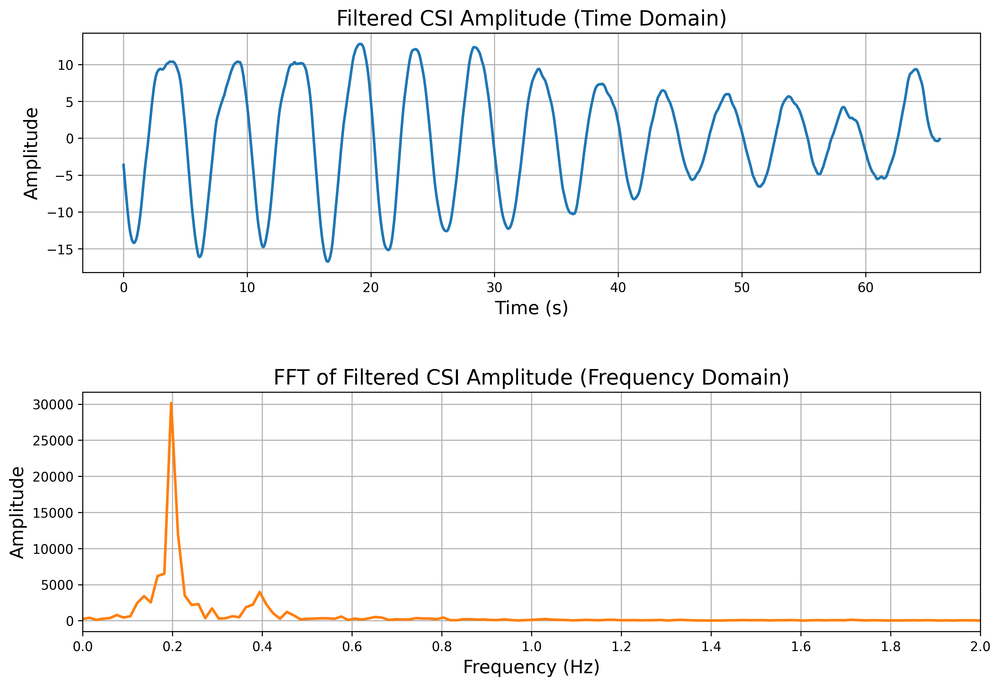

Visualization saved at: Visualization/csi_fft_filtered_comparison.png


In [20]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from scipy.fft import fft
import os

# Create directory for visualizations if it doesn't exist
output_dir = "Visualization/"
os.makedirs(output_dir, exist_ok=True)

# Apply FFT to the filtered CSI data
extracted_CSI = fft(filted_CSI_amp)  # FFT on preprocessed data

# Visualization
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), dpi=300)  # High DPI for quality
plt.subplots_adjust(left=0.1, bottom=0.1, top=0.9, right=0.9, hspace=0.5)  # Adjust layout

# Time axis for plotting
time_axis = np.linspace(0, filted_CSI_amp.shape[0], num=filted_CSI_amp.shape[0])

# Plot filtered time-domain CSI amplitude
ax1.plot(time_axis / 100, filted_CSI_amp, color='#1f77b4', linewidth=2)
ax1.set_ylabel('Amplitude', fontsize=14)
ax1.set_xlabel('Time (s)', fontsize=14)
ax1.set_title('Filtered CSI Amplitude (Time Domain)', fontsize=16)
ax1.grid(True)

# Plot frequency-domain CSI after FFT
N = extracted_CSI.shape[0]  # Number of samples in the FFT result
ax2.plot(np.linspace(0, 50, N // 2), np.abs(extracted_CSI[:N // 2]), color='#ff7f0e', linewidth=2)
ax2.set_xlabel('Frequency (Hz)', fontsize=14)
ax2.set_ylabel('Amplitude', fontsize=14)
ax2.set_xlim(0, 2)  # Limit the x-axis to focus on relevant frequencies
ax2.xaxis.set_major_locator(ticker.MultipleLocator(0.2))  # Set frequency ticks every 0.2 Hz
ax2.set_title('FFT of Filtered CSI Amplitude (Frequency Domain)', fontsize=16)
ax2.grid(True)

# Save the figure in the Visualization directory
output_path = os.path.join(output_dir, 'csi_fft_filtered_comparison.png')
plt.savefig(output_path, dpi=300, bbox_inches='tight')  # Save at 300 DPI

# Show the plot
plt.show()

print(f"Visualization saved at: {output_path}")


<font color=red>**Note:**</font>

In this example, the breath rate's time variation is not taken into account.
Specifically, even thought the user controlled his breath rate at 12 BPM, there are tiny fluctuations during the experiment as shown in the figure of the ground-truth (refer to Section 2.3). To gain better estimation accuracy, the time variation should be considered in order to improve estimation accuracy, and STFT (Short Time Fourier Transformation) is required. 

There are some online sources about STFT:

- https://en.wikipedia.org/wiki/Short-time_Fourier_transform
- https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.stft.html
- https://www.youtube.com/watch?v=-Yxj3yfvY-4


### Peak Detection

The location of the maximum of the "extracted CSI" is related to the predicted breathing rate based on the feature extraction approach described above.
Hence, to estimate the breathing rate, peak detection is needed.

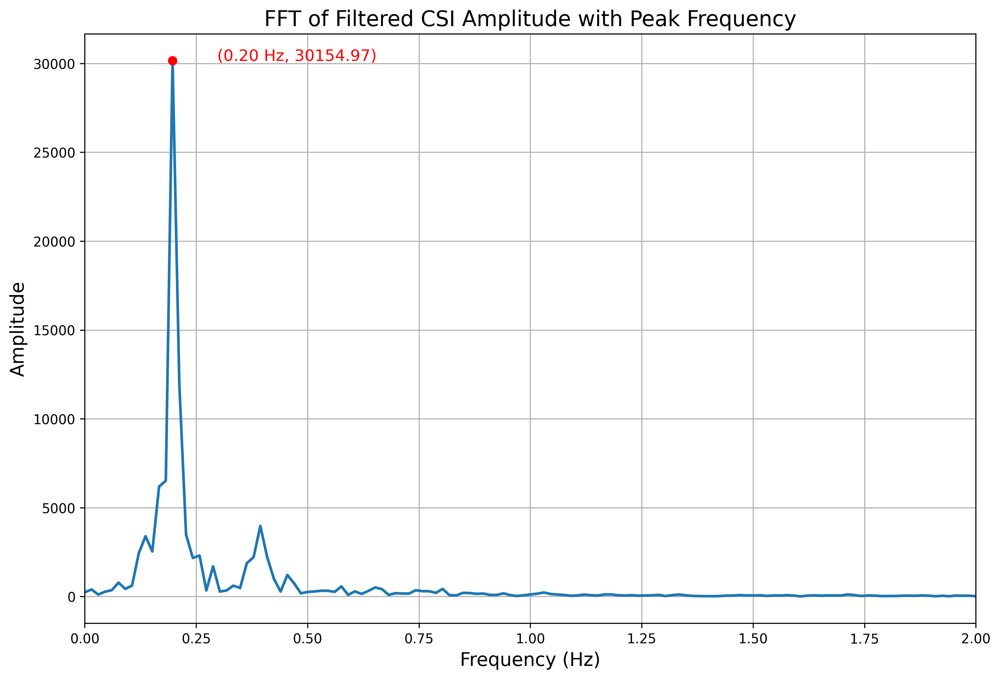

Estimated breathing rate: 11.82 BPM
Visualization saved at: Visualization/csi_fft_breathing_rate_estimation.png


In [21]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft
import os

# Create directory for visualizations if it doesn't exist
output_dir = "Visualization/"
os.makedirs(output_dir, exist_ok=True)

# Apply FFT to the filtered CSI data
extracted_CSI = fft(filted_CSI_amp)

# Find the location of the maximum frequency component
N = extracted_CSI.shape[0]  # Number of points from the FFT
max_value = np.max(np.abs(extracted_CSI[:N // 2]))  # Maximum value in the FFT result
arg_max = np.argmax(np.abs(extracted_CSI[:N // 2])) / (N // 2) * 50  # Frequency corresponding to the max value

# Estimate the breathing rate in BPM
result = arg_max * 60  # Convert frequency to breaths per minute (BPM)

# Visualization
plt.figure(figsize=(12, 8), dpi=300)  # High DPI for quality

# Plot frequency-domain CSI amplitude
plt.plot(np.linspace(0, 50, N // 2), np.abs(extracted_CSI[:N // 2]), color='#1f77b4', linewidth=2)
plt.xlabel('Frequency (Hz)', fontsize=14)
plt.ylabel('Amplitude', fontsize=14)
plt.xlim(0, 2)  # Focus on the frequency range relevant for breathing signals
plt.grid(True)

# Mark and annotate the maximum point
plt.plot(arg_max, max_value, 'ro')  # Mark the maximum point with a red circle
plt.text(arg_max + 0.1, max_value, f'({arg_max:.2f} Hz, {max_value:.2f})', fontsize=12, color='red')

# Title and save the plot
plt.title('FFT of Filtered CSI Amplitude with Peak Frequency', fontsize=16)
output_path = os.path.join(output_dir, 'csi_fft_breathing_rate_estimation.png')
plt.savefig(output_path, dpi=300, bbox_inches='tight')  # Save at 300 DPI

# Show the plot
plt.show()

# Print the estimated breathing rate
print(f"Estimated breathing rate: {result:.2f} BPM")
print(f"Visualization saved at: {output_path}")


<font color=red>**Note:**</font>
    
In the first experiment, there is only one user present in the office. 
We only need to estimate one breath rate series. In addition, We also assume that the breath rate is constant throughout the experiment because the breath rate's time variation is not taken into account.
Therefore, as demonstrated above, a single scalar can be used to describe the breath rate series: estimated breathing rate: 11.81818181818182 (BPM). 


### Result Evaluation

The mean square error (MSE) is used to evaluate the quality of the estimated breath rate. 
Additionally, the sampling rate of ground-truth series is 1 Hz,meaning that one measured breath rate is recorded every second.
To calculate the MSE, we need to up- or down-sampling the estimated breath rate series in order to provide one estimated breath rate per second.


MSE:  0.5307003360205628


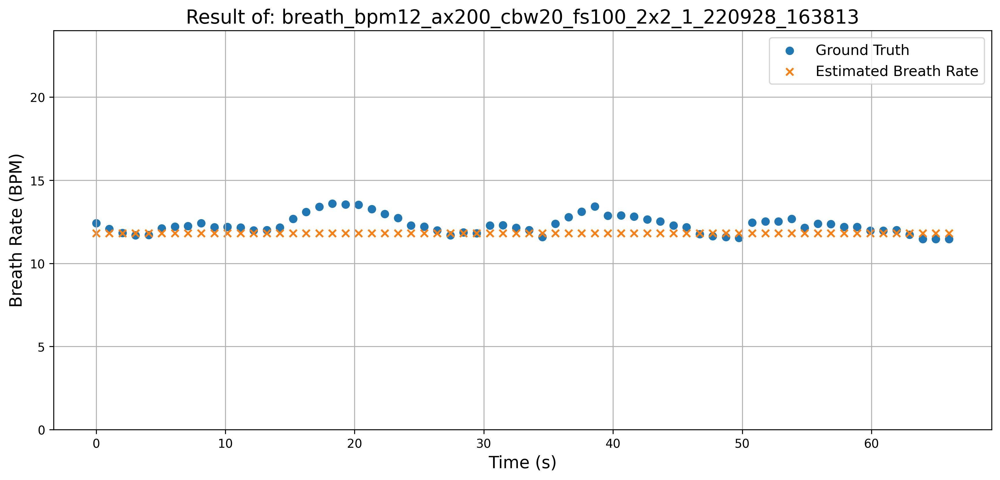

Visualization saved at: Visualization/breath_bpm12_ax200_cbw20_fs100_2x2_1_220928_163813_breath_rate_comparison.png


In [22]:
import numpy as np
import matplotlib.pyplot as plt
import os

# Create directory for visualizations if it doesn't exist
output_dir = "Visualization/"
os.makedirs(output_dir, exist_ok=True)

# Function to upsample the estimated breath rate
def upsampling(result, length):
    """
    result: The scalar value of the estimated breath rate.
    length: The length of the return series.
    
    This function repeats the estimated breath rate scalar to match the length.
    """
    return [result for _ in range(length)]

# Ensure groundtruth is flattened and has the correct length
def flatten_groundtruth(groundtruth):
    flattened = []
    for element in groundtruth:
        if isinstance(element, (list, np.ndarray)):
            flattened.append(np.ravel(element))  # Flatten if multi-dimensional
        else:
            flattened.append(element)  # Keep element as is if 1D
    return np.hstack(flattened)

# Flatten groundtruth to ensure it's a 1D array
groundtruth_flat = flatten_groundtruth(groundtruth)

# Upsampling the estimated breath rate to match the ground truth length
final_result = upsampling(result, len(groundtruth_flat))

# Function to calculate Mean Squared Error (MSE)
def MSE(final_result, groundtruth):
    re = np.array(final_result)  # Convert list to numpy array
    gr = np.array(groundtruth)  # Ensure groundtruth is a flat array
    return np.mean((re - gr) ** 2)

# Calculate MSE between the estimated and ground truth breath rates
mse = MSE(final_result, groundtruth_flat)
print("MSE: ", mse)

# Function to visualize the estimated breath rate and ground truth
def result_visualization(experiment_name, groundtruth, estimated_breath_rate):
    plt.figure(figsize=(14, 6), dpi=300)  # High DPI for quality
    time_axis = np.linspace(0, len(groundtruth), num=len(groundtruth))

    # Plot ground truth vs estimated breath rate
    plt.title(f'Result of: {experiment_name}', fontsize=16)
    plt.scatter(time_axis, groundtruth, label="Ground Truth", color='#1f77b4', marker='o')
    plt.scatter(time_axis, estimated_breath_rate, label="Estimated Breath Rate", color='#ff7f0e', marker='x')
    
    plt.ylabel('Breath Rate (BPM)', fontsize=14)
    plt.xlabel('Time (s)', fontsize=14)
    plt.ylim(0, 24)
    plt.legend(fontsize=12)
    plt.grid(True)

    # Save the plot
    output_path = os.path.join(output_dir, f'{experiment_name}_breath_rate_comparison.png')
    plt.savefig(output_path, dpi=300, bbox_inches='tight')  # Save at 300 DPI

    # Show the plot
    plt.show()

    print(f"Visualization saved at: {output_path}")

# Visualizing the estimated breath rate vs ground truth
result_visualization(experiment_name, groundtruth_flat, final_result)


---
---

# Part II: Task

Three tasks need to be completed in this part.
The level of difficulty gradually rises from task_1 to task_3. 

<font color=red>Note:</font>

The parts you need to complete will be marked with `# STEP`.

In [23]:
# importing some libraries we need in this part. You can add more as needed.
import scipy.io
import numpy as np
import os
from collections import defaultdict, Counter
import pandas as pd
from matplotlib import pyplot as plt
import pickle
from scipy import signal
from scipy.fft import fft, fftfreq

## Task1: Controlled breath estimation (one person) // Points: 60

In this task, you need to build a method for estimating a user's breathing rate in controlled mode. Specifically, <font color=red>there are two cases: 15 BPM and 20 BPM. You need to illustrate the building process of your method by using the 15 BPM case. While only the result evaluation is needed in the 20 BPM case. </font>
A basic version of this method has been demonstrated in the Part I.

### 15 BPM case // Points: 56

In [24]:
import pickle

# Load the dataset
with open('Data/trainset.pickle', 'rb') as handle:
    trainset = pickle.load(handle)

# Select the CSI series and ground truth for the 15 BPM case
CSI = trainset['CSI'][1] 
groundtruth = trainset['groundtruth'][1]  # Ground truth for the 15 BPM case
experiment_name = trainset['ex_name'][1][:-4]
print("The name of this experiment: ", experiment_name)


The name of this experiment:  breath_bpm15_ax200_cbw20_fs100_2x2_1_220928_164837


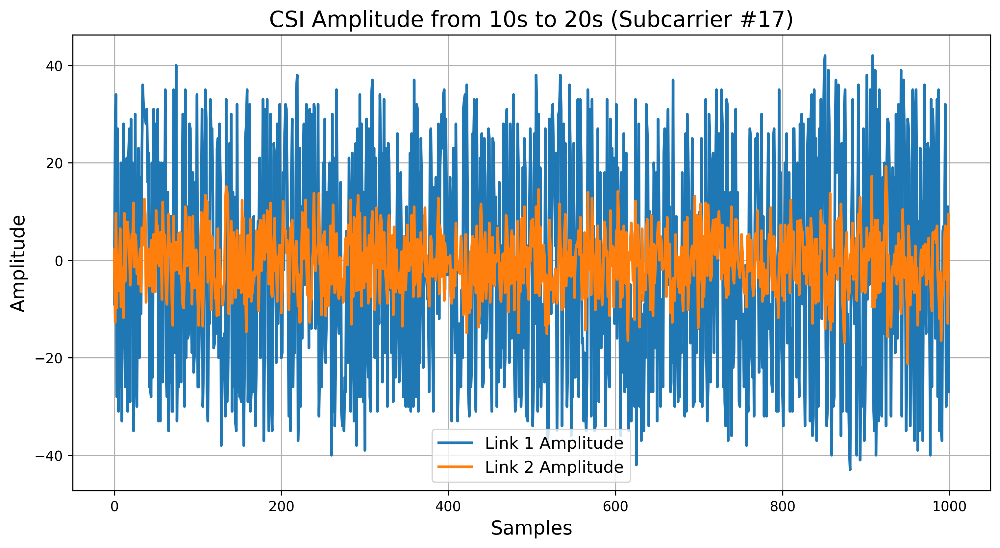

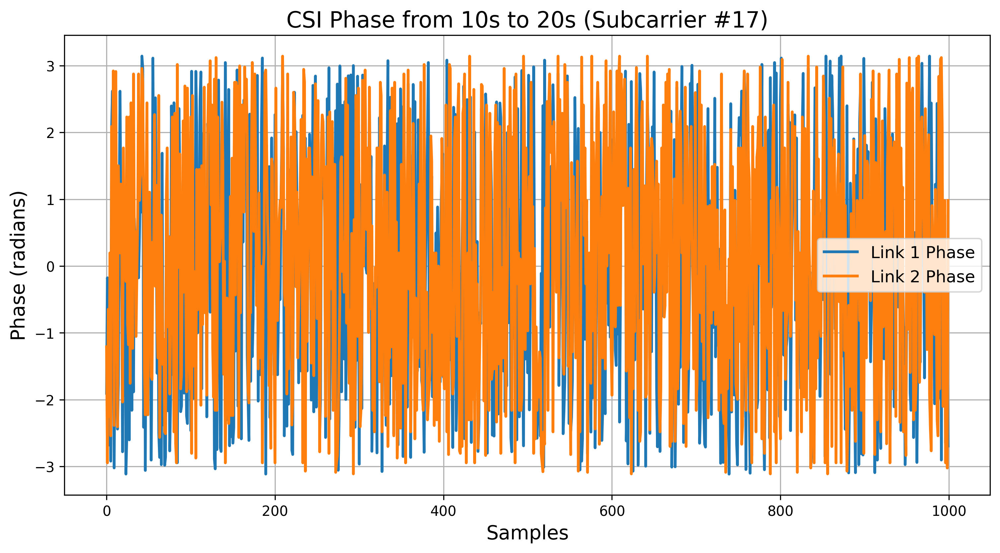

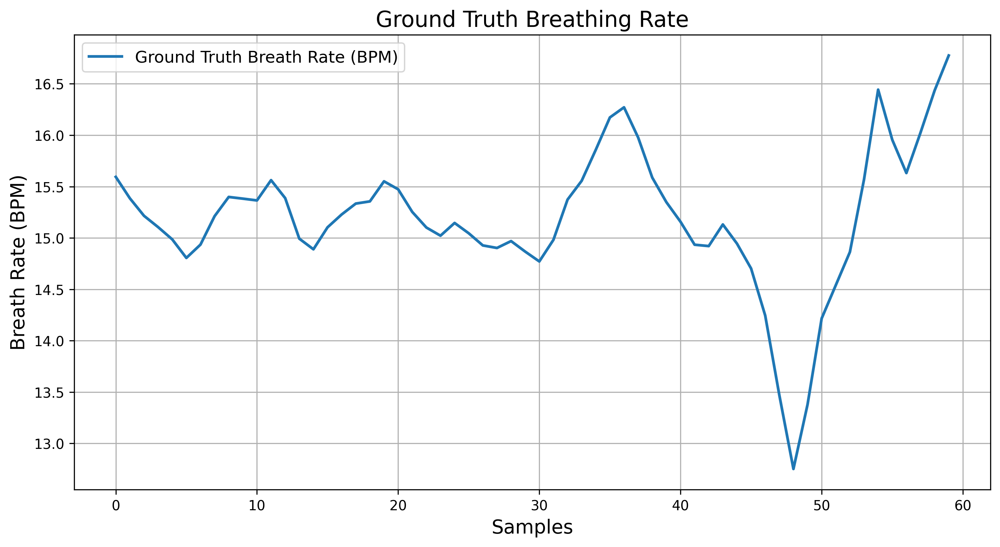

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import os

# Create directory for visualizations if it doesn't exist
output_dir = "Visualization/"
os.makedirs(output_dir, exist_ok=True)

def DataVisualization(CSI, groundtruth):
    # Step 1: Visualize the CSI from 10s - 20s on subcarrier #17 of all links
    time_range = (1000, 2000)  # 10s to 20s in samples

    # Visualize Amplitude
    plt.figure(figsize=(12, 6), dpi=300)
    for link in range(2):  # Assuming 2 links
        plt.plot(CSI[time_range[0]:time_range[1], 17, link, 0], label=f'Link {link+1} Amplitude', linewidth=2)
    plt.title('CSI Amplitude from 10s to 20s (Subcarrier #17)', fontsize=16)
    plt.xlabel('Samples', fontsize=14)
    plt.ylabel('Amplitude', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True)

    # Save the figure
    plt.savefig(os.path.join(output_dir, 'csi_amplitude_subcarrier_17.png'), dpi=300, bbox_inches='tight')
    plt.show()

    # Visualize Phase
    plt.figure(figsize=(12, 6), dpi=300)
    for link in range(2):  # Assuming 2 links
        plt.plot(np.angle(CSI[time_range[0]:time_range[1], 17, link, 0]), label=f'Link {link+1} Phase', linewidth=2)
    plt.title('CSI Phase from 10s to 20s (Subcarrier #17)', fontsize=16)
    plt.xlabel('Samples', fontsize=14)
    plt.ylabel('Phase (radians)', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True)

    # Save the figure
    plt.savefig(os.path.join(output_dir, 'csi_phase_subcarrier_17.png'), dpi=300, bbox_inches='tight')
    plt.show()

    # Step 3: Visualize the ground truth
    plt.figure(figsize=(12, 6), dpi=300)
    plt.plot(groundtruth, label='Ground Truth Breath Rate (BPM)', linewidth=2)
    plt.title('Ground Truth Breathing Rate', fontsize=16)
    plt.xlabel('Samples', fontsize=14)
    plt.ylabel('Breath Rate (BPM)', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True)

    # Save the figure
    plt.savefig(os.path.join(output_dir, 'groundtruth_breath_rate.png'), dpi=300, bbox_inches='tight')
    plt.show()

# Call the visualization function
DataVisualization(CSI, groundtruth)


In [26]:
# Preprocessing

# Phase Cleaning
# the sanitization function is given to eliminate the phase offset
from cmath import pi


def sanitization(x):
    F = len(x)
    phase = np.angle(x)
    phase = np.unwrap(phase)
    a = (phase[-1] - phase[0]) / (2 * pi * F)
    b = sum(phase) / F

    firstpart = (np.arange(F) + 1) * a
    secondpart = np.ones(F) * b
    phase = phase - firstpart - secondpart

    return x * np.exp(1j * phase)


def phase_cleaning(CSI):
    for i in range(CSI.shape[0]):
        CSI[i, :, 0, 0] = sanitization(CSI[i, :, 0, 0])
        CSI[i, :, 0, 1] = sanitization(CSI[i, :, 0, 1])
        CSI[i, :, 1, 0] = sanitization(CSI[i, :, 1, 0])
        CSI[i, :, 1, 1] = sanitization(CSI[i, :, 1, 1])
    return CSI


def Preprocessing(CSI):
    CSI = phase_cleaning(CSI)  # Phase cleaning
    CSI_amplitude = np.abs(CSI)  # The amplitude of CSI series
    CSI_phase = np.angle(CSI)  # The phase of CSI series
    
    # Check if the length of the data is sufficient
    if CSI_amplitude.shape[0] < 10:  # Adjust this threshold as needed
        raise ValueError("Insufficient length of CSI data for filtering.")

    # Butterworth filter parameters
    b, a = signal.butter(1, [0.002, 0.005], 'bandpass')  # Butterworth bandpass filter
    
    # Filter amplitude and phase
    filtered_amplitude = signal.filtfilt(b, a, CSI_amplitude, axis=0)
    filtered_phase = signal.filtfilt(b, a, CSI_phase, axis=0)

    return filtered_amplitude, filtered_phase

# Preprocess the CSI
try:
    processed_CSI_amplitude, processed_CSI_phase = Preprocessing(CSI)
except ValueError as e:
    print("Error during preprocessing:", e)




# processed_CSI_amplitude, processed_CSI_phase = Preprocessing(CSI)

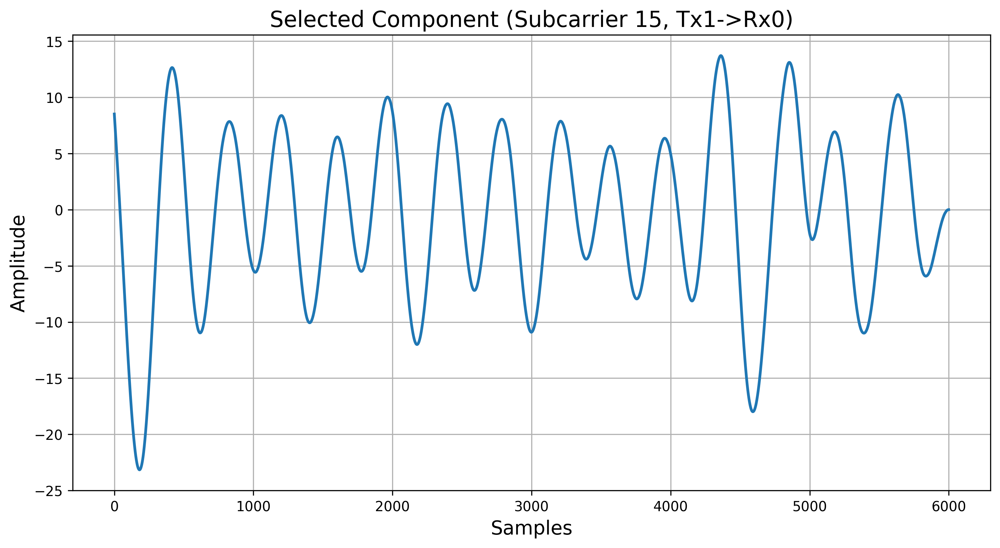

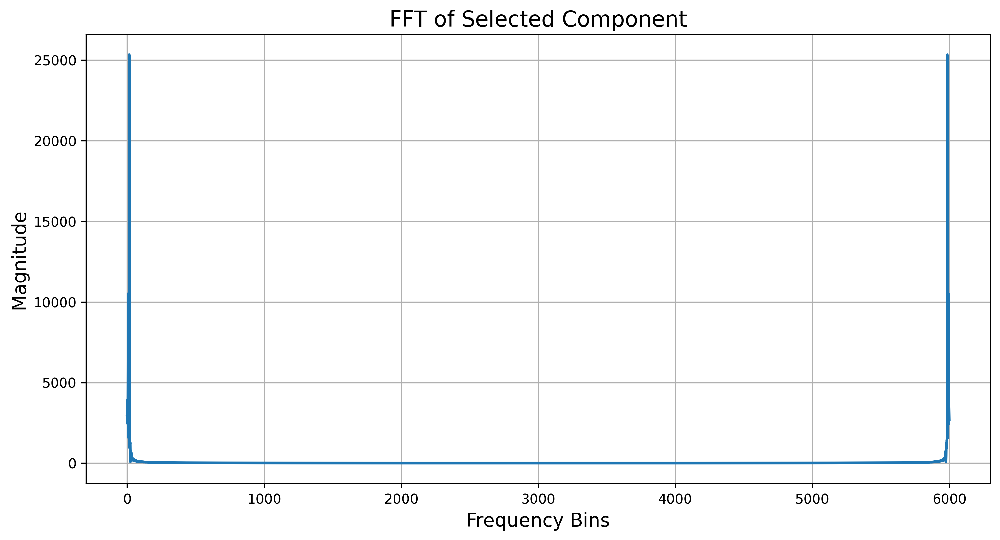

Selected component plot saved at: Visualization/selected_component_subcarrier_15.png
FFT plot saved at: Visualization/fft_selected_component.png


In [27]:
import numpy as np
import matplotlib.pyplot as plt
import os

# Create directory for visualizations if it doesn't exist
output_dir = "Visualization/"
os.makedirs(output_dir, exist_ok=True)

def FeatureDetection(processed_CSI_amplitude, processed_CSI_phase):
    # STEP #5: There are three decisions to make:
    # 5.1: Your decision (please change the default value to your setting):
    selected_Rx = 0  # the selected Rx: 0 or 1
    selected_Tx = 1  # the selected Tx: 0 or 1
    selected_subcarrier = 15  # the selected subcarriers from 245 subcarriers

    # Select either amplitude or phase based on your observation
    selected_component = processed_CSI_amplitude[:, selected_subcarrier, selected_Rx, selected_Tx]
    # OR: selected_component = processed_CSI_phase[:,selected_subcarrier,selected_Rx,selected_Tx]

    # 5.2: Visualize the selected component
    plt.figure(figsize=(12, 6), dpi=300)
    plt.plot(selected_component, linewidth=2)
    plt.title(f'Selected Component (Subcarrier {selected_subcarrier}, Tx{selected_Tx}->Rx{selected_Rx})', fontsize=16)
    plt.xlabel('Samples', fontsize=14)
    plt.ylabel('Amplitude', fontsize=14)
    plt.grid(True)

    # Save the figure
    output_path = os.path.join(output_dir, f'selected_component_subcarrier_{selected_subcarrier}.png')
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.show()

    # =========================================================
    # STEP #6: Using FFT to extract the breath-related features
    # 6.1: Apply FFT to the selected component
    feature = np.fft.fft(selected_component)

    # 6.2: Visualize the FFT result
    plt.figure(figsize=(12, 6), dpi=300)
    plt.plot(np.abs(feature), linewidth=2)
    plt.title('FFT of Selected Component', fontsize=16)
    plt.xlabel('Frequency Bins', fontsize=14)
    plt.ylabel('Magnitude', fontsize=14)
    plt.grid(True)

    # Save the FFT figure
    fft_output_path = os.path.join(output_dir, 'fft_selected_component.png')
    plt.savefig(fft_output_path, dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Selected component plot saved at: {output_path}")
    print(f"FFT plot saved at: {fft_output_path}")

    # Return the feature
    return feature

# Call the FeatureDetection function
feature = FeatureDetection(processed_CSI_amplitude, processed_CSI_phase)


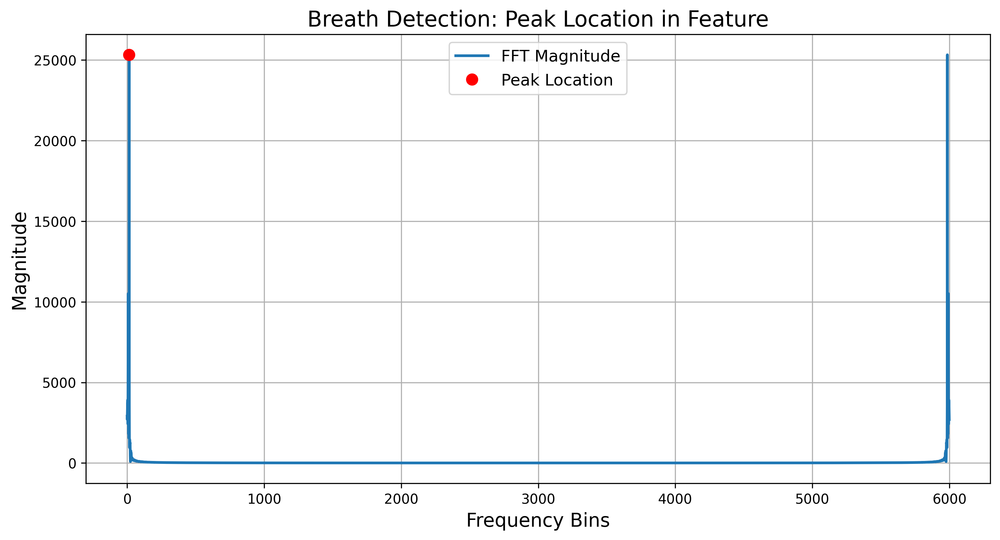

Breath detection plot saved at: Visualization/breath_detection_peak_location.png
Estimated Breathing Rate:  15.0 BPM


In [28]:
import numpy as np
import matplotlib.pyplot as plt
import os

# Create directory for visualizations if it doesn't exist
output_dir = "Visualization/"
os.makedirs(output_dir, exist_ok=True)

def BreathDetection(feature):
    # STEP #7: Find the location of peak in feature
    # 7.1: Find the maximum peak in the FFT feature
    max_value = np.max(np.abs(feature))
    arg_max = np.argmax(np.abs(feature))

    # 7.2: Transform the location of peak to estimated breath rate (unit: BPM)
    # Assume that the sampling frequency is 100 Hz
    # Convert frequency bin index to Hz
    sampling_frequency = 100  # Hz
    frequency = arg_max * (sampling_frequency / len(feature))  # Convert bin index to frequency in Hz
    estimated_breath_rate = frequency * 60  # Convert to BPM

    # 7.3: Visualize the location of peak with the feature
    plt.figure(figsize=(12, 6), dpi=300)
    plt.plot(np.abs(feature), label='FFT Magnitude', linewidth=2)
    plt.plot(arg_max, max_value, 'ro', label='Peak Location', markersize=8)
    plt.title('Breath Detection: Peak Location in Feature', fontsize=16)
    plt.xlabel('Frequency Bins', fontsize=14)
    plt.ylabel('Magnitude', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True)

    # Save the figure
    output_path = os.path.join(output_dir, 'breath_detection_peak_location.png')
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Breath detection plot saved at: {output_path}")

    # Return the estimated breath rate
    return estimated_breath_rate

# Call the BreathDetection function
result = BreathDetection(feature)
print("Estimated Breathing Rate: ", result, "BPM")


MSE:  0.4956682020579469


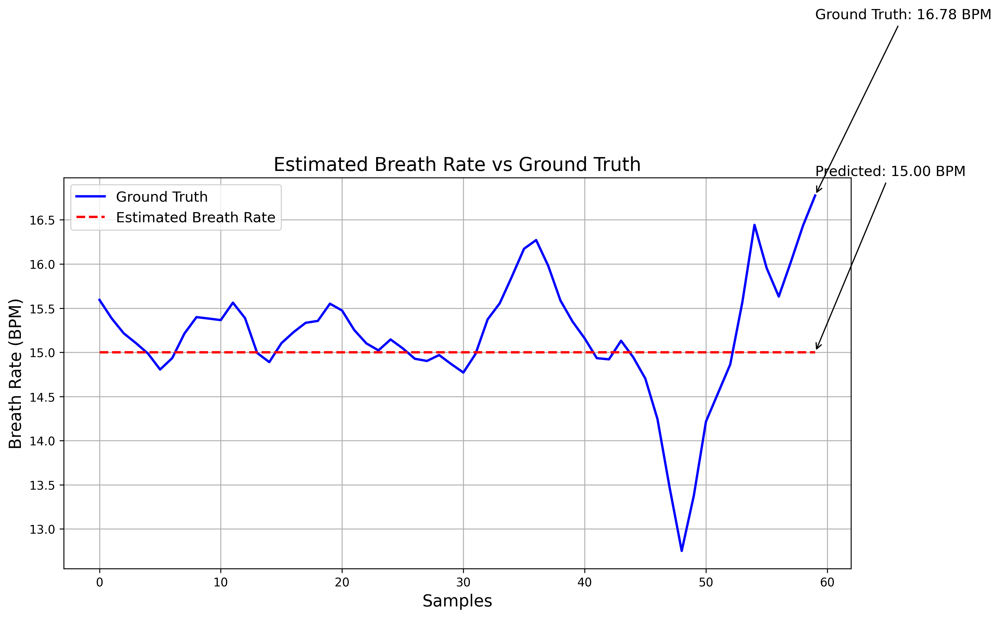

Visualization saved at: Visualization/breath_rate_comparison_with_annotations.png


In [29]:
import numpy as np
import matplotlib.pyplot as plt
import os

# Create directory for visualizations if it doesn't exist
output_dir = "Visualization/"
os.makedirs(output_dir, exist_ok=True)

# Up-sampling function
def upsampling(result, length):
    """
    result: The scalar value of the estimated breath rate.
    length: The length of the return series.
    
    This function repeats the estimated breath rate scalar to match the length.
    """
    return [result for _ in range(length)]  # Repeat the estimated rate for 'length' times

# Up-sample the estimated breath rate to match the length of groundtruth
final_result = upsampling(result, len(groundtruth))

# MSE Calculation
def MSE(final_result, groundtruth):
    re = np.array(final_result)  # Convert list to numpy array
    gr = np.array(groundtruth)  # Convert groundtruth to numpy array
    return np.mean((re - gr) ** 2)  # Calculate and return the mean squared error

# Calculate MSE between the upsampled breath rate and ground truth
mse = MSE(final_result, groundtruth)
print("MSE: ", mse)

# Visualization of estimated breath rate vs ground truth

def result_visualization(groundtruth, final_result):
    plt.figure(figsize=(12, 6), dpi=300)  # High DPI for quality
    plt.plot(groundtruth, label='Ground Truth', color='blue', linewidth=2)
    plt.plot(final_result, label='Estimated Breath Rate', color='red', linestyle='--', linewidth=2)
    
    # Adding annotations for the last predicted and ground truth values
    plt.annotate(f'Predicted: {final_result[-1]:.2f} BPM',
                 xy=(len(final_result)-1, final_result[-1]),
                 xytext=(len(final_result)-1, final_result[-1] + 2),
                 arrowprops=dict(facecolor='black', arrowstyle='->'),
                 fontsize=12)
    
    plt.annotate(f'Ground Truth: {groundtruth[-1]:.2f} BPM',
                 xy=(len(groundtruth)-1, groundtruth[-1]),
                 xytext=(len(groundtruth)-1, groundtruth[-1] + 2),
                 arrowprops=dict(facecolor='black', arrowstyle='->'),
                 fontsize=12)
    
    plt.title('Estimated Breath Rate vs Ground Truth', fontsize=16)
    plt.xlabel('Samples', fontsize=14)
    plt.ylabel('Breath Rate (BPM)', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True)

    # Save the figure
    output_path = os.path.join(output_dir, 'breath_rate_comparison_with_annotations.png')
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Visualization saved at: {output_path}")

# Call the updated result visualization function
result_visualization(groundtruth, final_result)



### 20 BPM case // Points: 4

In this part, you don't need to write code. You just need to run this part of the code to test the performance of the method you built in the above part in the 20 BPM case.

In [30]:
CSI = trainset['CSI'][1]  # the CSI series
groundtruth = trainset['groundtruth'][1]  # loading the ground-truth
experiment_name = trainset['ex_name'][1][:-4]
print("the name of this experiment: ", experiment_name)

the name of this experiment:  breath_bpm15_ax200_cbw20_fs100_2x2_1_220928_164837


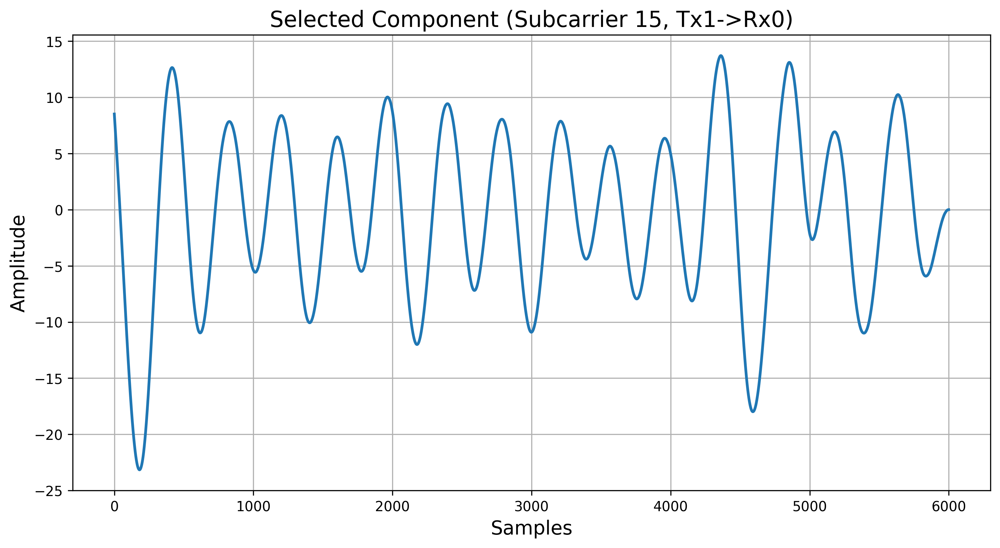

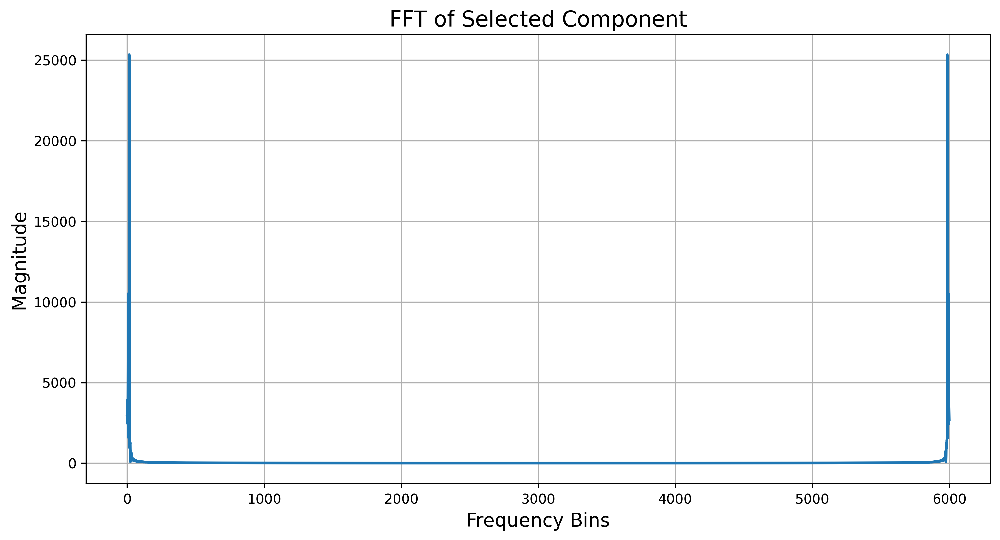

Selected component plot saved at: Visualization/selected_component_subcarrier_15.png
FFT plot saved at: Visualization/fft_selected_component.png


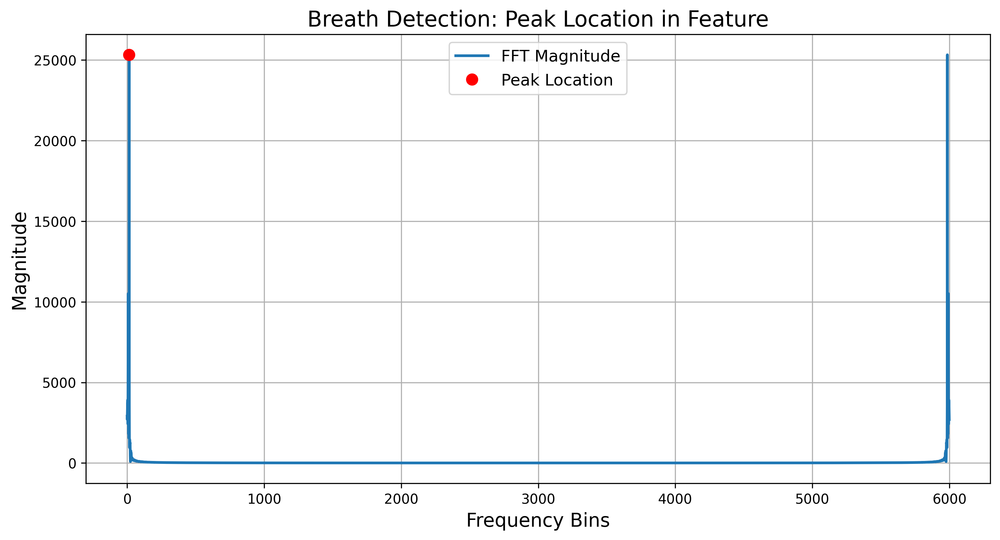

Breath detection plot saved at: Visualization/breath_detection_peak_location.png


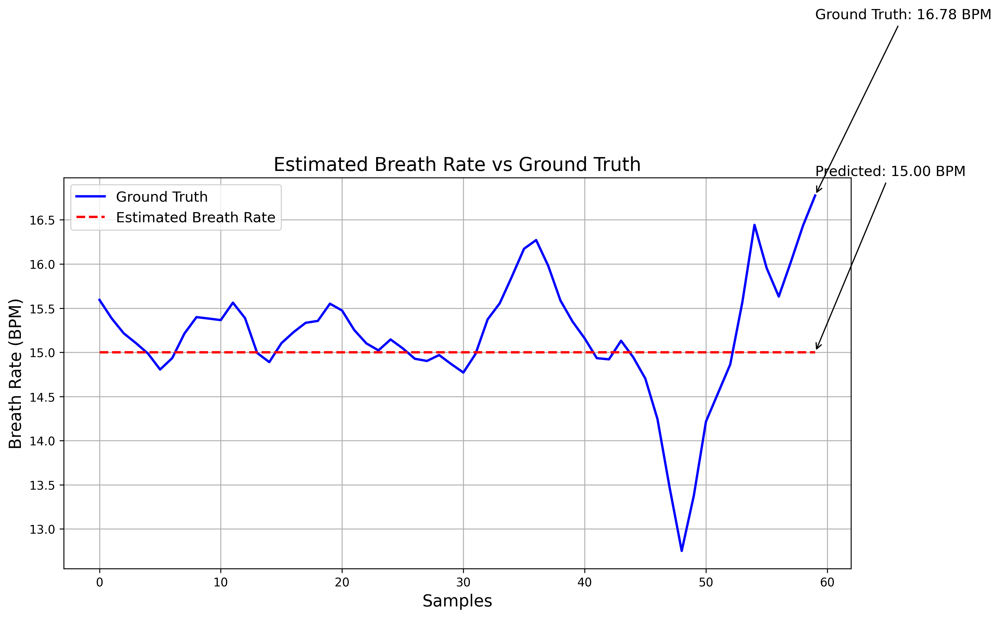

Visualization saved at: Visualization/breath_rate_comparison_with_annotations.png
MSE:  0.4956682020579469


In [31]:
processed_CSI_amplitude, processed_CSI_phase = Preprocessing(CSI)
feature = FeatureDetection(processed_CSI_amplitude, processed_CSI_phase)
result = BreathDetection(feature)
final_result = upsampling(result, len(groundtruth))
mse = MSE(final_result, groundtruth)
result_visualization(groundtruth, final_result)
print("MSE: ", mse)

---
## Task2: Controlled breath estimation (two person)  // Points: 10

In this task, you need to build a method for estimating two users' breathing rates in controlled mode. Specifically, <font color=red>there are two cases: Case1: one user with 15 BMP and another with 20 BMP; case2: one user with 15 BMP and another with 24 BMP. The method for this task is similar to the Task1. While the result should be two estimated breath rates. You need to illustrate the building process of your method by using the 15-20 BPM case. While only the result evaluation is needed in the 15-24 BPM case. </font>

### 15-20 BPM case // Points: 8

In [32]:
# Data for this task:
with open('Data/trainset.pickle', 'rb') as handle:
    trainset = pickle.load(handle)

CSI = trainset['CSI'][6]  # the CSI series
groundtruth = trainset['groundtruth'][6]  # loading the ground-truth
experiment_name = trainset['ex_name'][6][:-4]
print("the name of this experiment: ", experiment_name)

the name of this experiment:  breath_bpm15-20_multiperson_ax200_cbw20_fs100_2x2_1_220928_173606


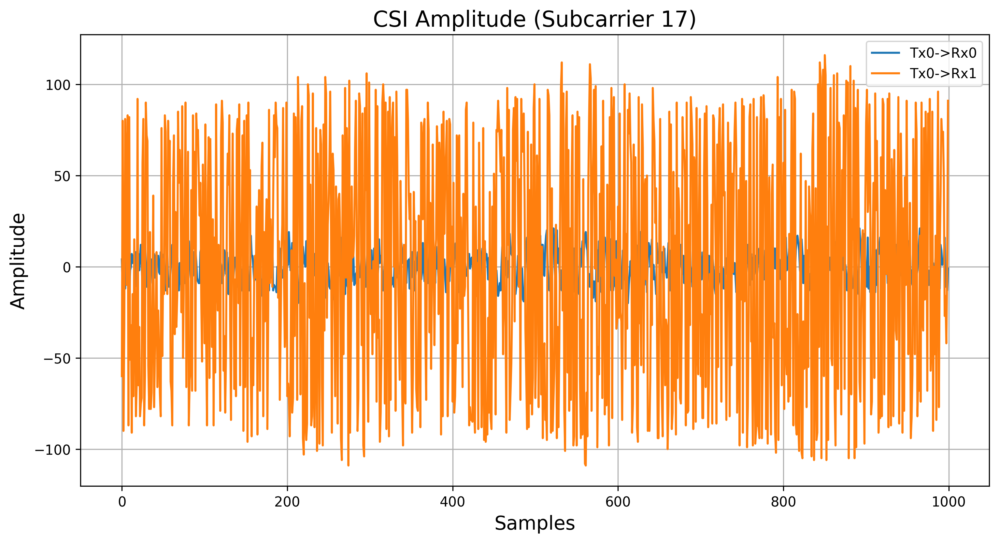

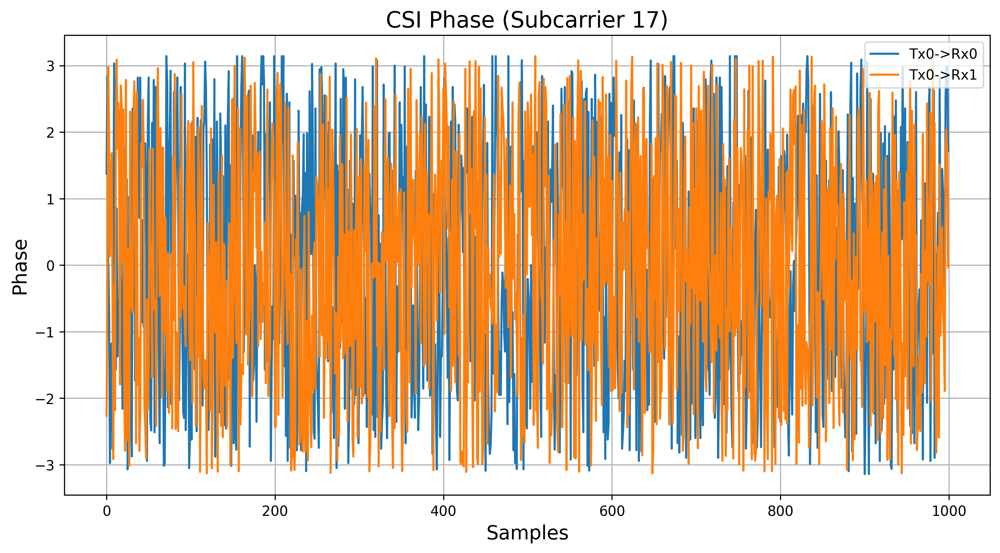

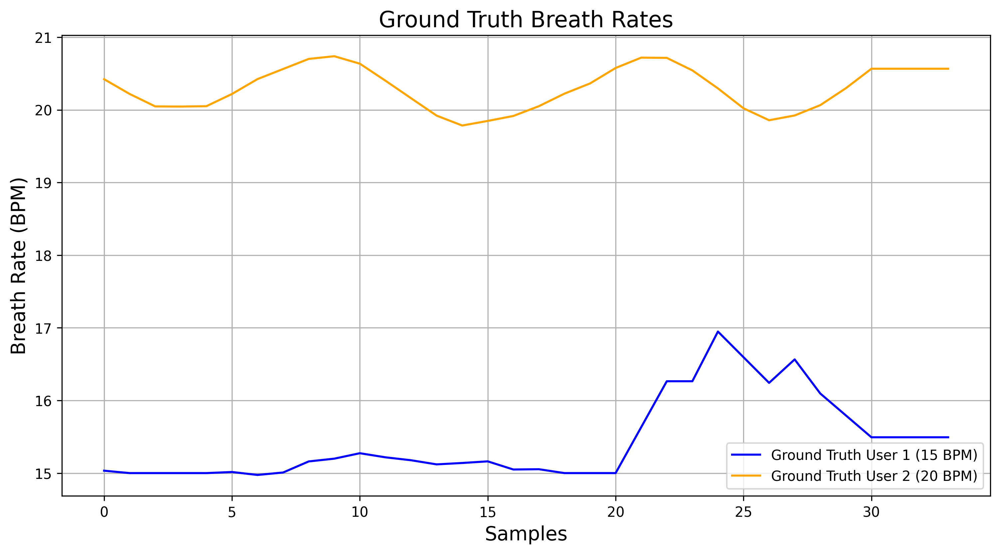

In [33]:
def DataVisualization(CSI, groundtruth):
    # STEP #1: Visualize the CSI from 10s - 20s on subcarrier #17 of all links
    time_range = (1000, 2000)  # Example range, adjust as needed
    selected_subcarrier = 17

    # 1.1: Visualize the amplitude
    plt.figure(figsize=(12, 6), dpi=300)
    for rx in range(2):  # For both receiving antennas
        plt.plot(CSI[time_range[0]:time_range[1], selected_subcarrier, 0, rx], label=f'Tx0->Rx{rx}')
    plt.title('CSI Amplitude (Subcarrier 17)', fontsize=16)
    plt.xlabel('Samples', fontsize=14)
    plt.ylabel('Amplitude', fontsize=14)
    plt.legend()
    plt.grid()
    plt.savefig(os.path.join(output_dir, 'csi_amplitude_subcarrier_17.png'), dpi=300, bbox_inches='tight')
    plt.show()

    # 1.2: Visualize the phase
    plt.figure(figsize=(12, 6), dpi=300)
    for rx in range(2):  # For both receiving antennas
        plt.plot(np.angle(CSI[time_range[0]:time_range[1], selected_subcarrier, 0, rx]), label=f'Tx0->Rx{rx}')
    plt.title('CSI Phase (Subcarrier 17)', fontsize=16)
    plt.xlabel('Samples', fontsize=14)
    plt.ylabel('Phase', fontsize=14)
    plt.legend()
    plt.grid()
    plt.savefig(os.path.join(output_dir, 'csi_phase_subcarrier_17.png'), dpi=300, bbox_inches='tight')
    plt.show()

    # STEP #3: Visualize the ground-truth
    plt.figure(figsize=(12, 6), dpi=300)
    plt.plot(groundtruth[0], label='Ground Truth User 1 (15 BPM)', color='blue')
    plt.plot(groundtruth[1], label='Ground Truth User 2 (20 BPM)', color='orange')
    plt.title('Ground Truth Breath Rates', fontsize=16)
    plt.xlabel('Samples', fontsize=14)
    plt.ylabel('Breath Rate (BPM)', fontsize=14)
    plt.legend()
    plt.grid()
    plt.savefig(os.path.join(output_dir, 'ground_truth_breath_rates.png'), dpi=300, bbox_inches='tight')
    plt.show()

DataVisualization(CSI, groundtruth)


In [34]:
from scipy import signal

def Preprocessing(CSI):
    # Phase Cleaning
    def sanitization(x):
        F = len(x)
        phase = np.angle(x)
        phase = np.unwrap(phase)
        a = (phase[-1] - phase[0]) / (2 * np.pi * F)
        b = sum(phase) / F

        firstpart = (np.arange(F) + 1) * a
        secondpart = np.ones(F) * b
        phase = phase - firstpart - secondpart

        return x * np.exp(1j * phase)

    def phase_cleaning(CSI):
        for i in range(CSI.shape[0]):
            CSI[i, :, 0, 0] = sanitization(CSI[i, :, 0, 0])
            CSI[i, :, 0, 1] = sanitization(CSI[i, :, 0, 1])
            CSI[i, :, 1, 0] = sanitization(CSI[i, :, 1, 0])
            CSI[i, :, 1, 1] = sanitization(CSI[i, :, 1, 1])
        return CSI

    CSI = phase_cleaning(CSI)  # Clean phase

    # Using a Butterworth filter to process the CSI amplitude
    CSI_amplitude = np.abs(CSI)  # The amplitude of CSI series
    CSI_phase = np.angle(CSI)  # The phase of CSI series

    # Define Butterworth Bandpass Filter
    b, a = signal.butter(1, [0.002, 0.005], 'bandpass')  # 1 is the order of the filter

    # Filter amplitude and phase
    filtered_amplitude = signal.filtfilt(b, a, CSI_amplitude, axis=0)
    filtered_phase = signal.filtfilt(b, a, CSI_phase, axis=0)

    return filtered_amplitude, filtered_phase

# Preprocess the CSI data
processed_CSI_amplitude, processed_CSI_phase = Preprocessing(CSI)

# Visualize the results (you can implement similar to the previous visualizations)
# Visualization will be implemented in the next step.


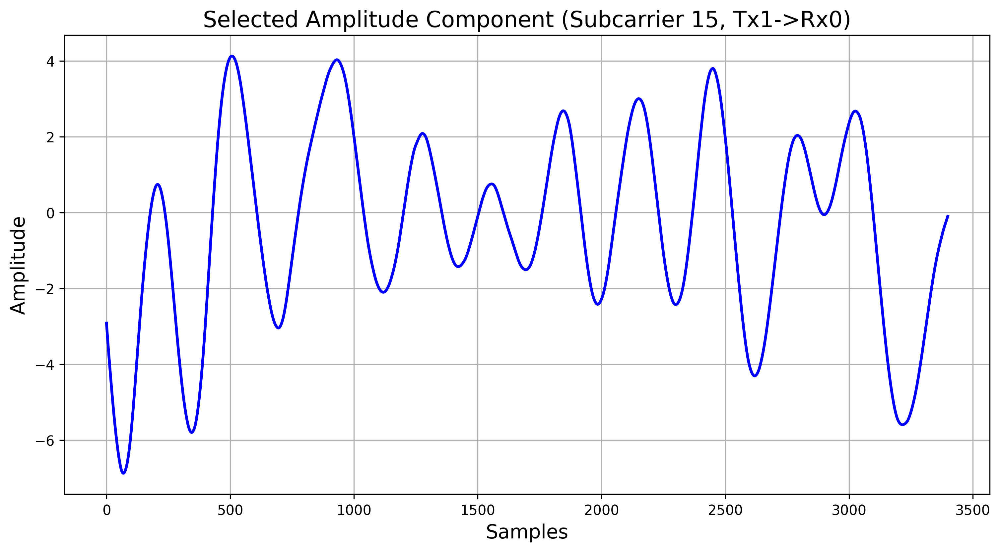

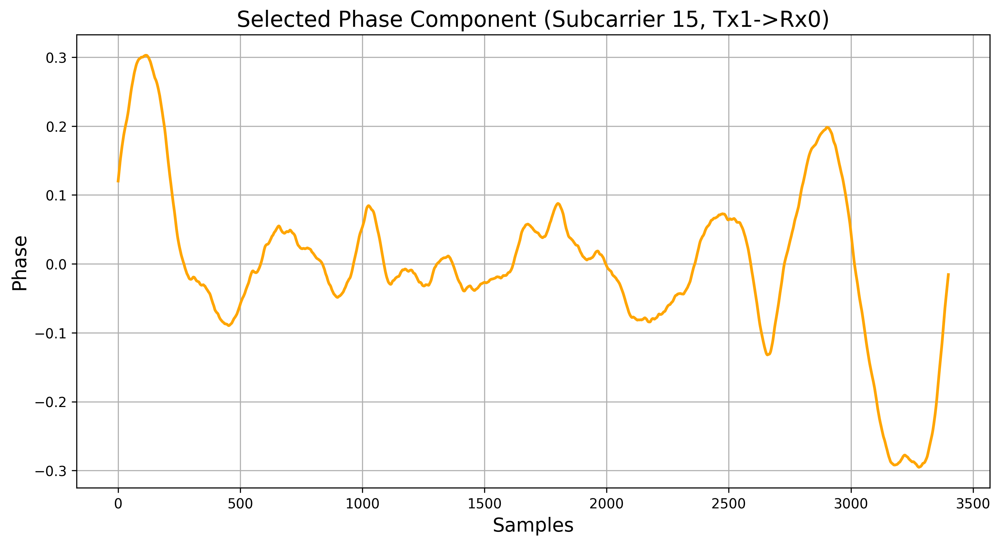

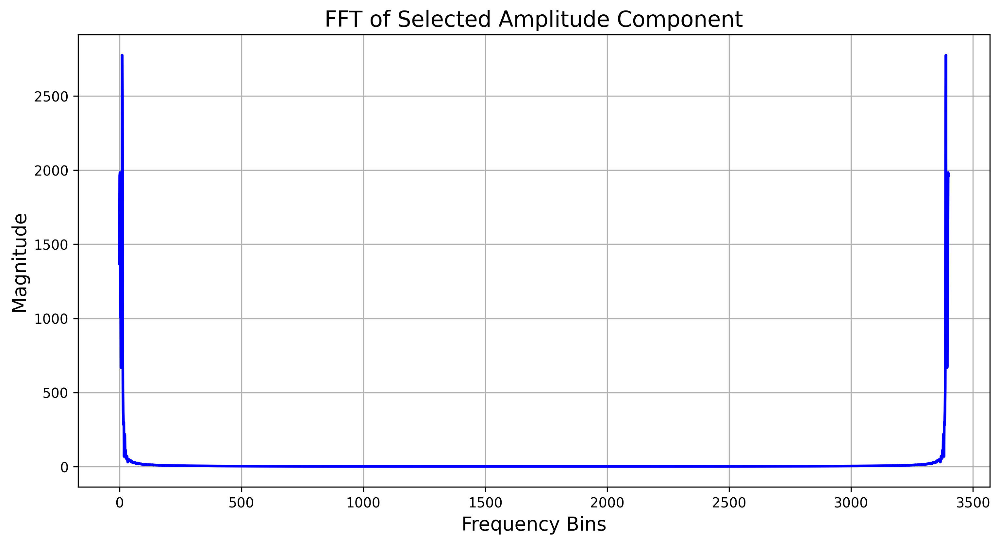

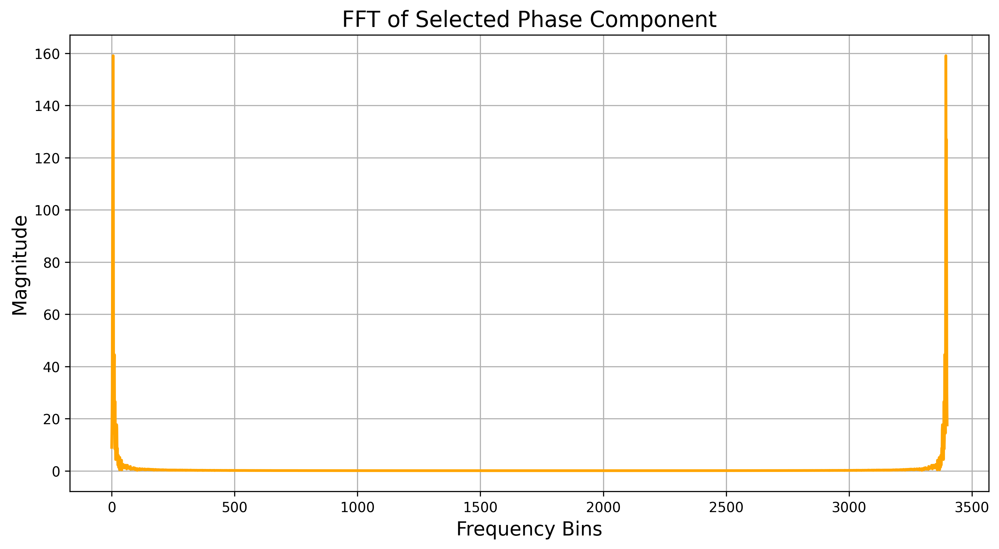

In [35]:
def FeatureDetection(processed_CSI_amplitude, processed_CSI_phase):
    # STEP #5: There are three decisions to make:
    # 5.1: Your decision (please change the default value to your setting):
    selected_Rx = 0  # the selected of Rx: 0 or 1
    selected_Tx = 1  # the selected of Tx: 0 or 1
    selected_subcarrier = 15  # the selected subcarriers from 245 subcarriers

    # Select either amplitude or phase based on your observation
    selected_component_amplitude = processed_CSI_amplitude[:, selected_subcarrier, selected_Rx, selected_Tx]
    selected_component_phase = processed_CSI_phase[:, selected_subcarrier, selected_Rx, selected_Tx]

    # 5.2: Visualize the selected amplitude component here
    plt.figure(figsize=(12, 6), dpi=300)
    plt.plot(selected_component_amplitude, color='blue', linewidth=2)
    plt.title(f'Selected Amplitude Component (Subcarrier {selected_subcarrier}, Tx{selected_Tx}->Rx{selected_Rx})', fontsize=16)
    plt.xlabel('Samples', fontsize=14)
    plt.ylabel('Amplitude', fontsize=14)
    plt.grid(True)
    plt.savefig(os.path.join(output_dir, f'selected_amplitude_component_subcarrier_{selected_subcarrier}.png'), dpi=300, bbox_inches='tight')
    plt.show()

    # 5.3: Visualize the selected phase component here
    plt.figure(figsize=(12, 6), dpi=300)
    plt.plot(selected_component_phase, color='orange', linewidth=2)
    plt.title(f'Selected Phase Component (Subcarrier {selected_subcarrier}, Tx{selected_Tx}->Rx{selected_Rx})', fontsize=16)
    plt.xlabel('Samples', fontsize=14)
    plt.ylabel('Phase', fontsize=14)
    plt.grid(True)
    plt.savefig(os.path.join(output_dir, f'selected_phase_component_subcarrier_{selected_subcarrier}.png'), dpi=300, bbox_inches='tight')
    plt.show()

    # STEP #6: Using FFT to extract the breath-related features
    # 6.1: Processing the selected_component here
    feature_amplitude = np.fft.fft(selected_component_amplitude)
    feature_phase = np.fft.fft(selected_component_phase)

    # 6.2: Visualize the FFT of the selected amplitude component
    plt.figure(figsize=(12, 6), dpi=300)
    plt.plot(np.abs(feature_amplitude), color='blue', linewidth=2)
    plt.title('FFT of Selected Amplitude Component', fontsize=16)
    plt.xlabel('Frequency Bins', fontsize=14)
    plt.ylabel('Magnitude', fontsize=14)
    plt.grid(True)
    plt.savefig(os.path.join(output_dir, 'fft_selected_amplitude_component.png'), dpi=300, bbox_inches='tight')
    plt.show()

    # Visualize the FFT of the selected phase component
    plt.figure(figsize=(12, 6), dpi=300)
    plt.plot(np.abs(feature_phase), color='orange', linewidth=2)
    plt.title('FFT of Selected Phase Component', fontsize=16)
    plt.xlabel('Frequency Bins', fontsize=14)
    plt.ylabel('Magnitude', fontsize=14)
    plt.grid(True)
    plt.savefig(os.path.join(output_dir, 'fft_selected_phase_component.png'), dpi=300, bbox_inches='tight')
    plt.show()

    # Return the features
    return feature_amplitude, feature_phase

# Call the FeatureDetection function
features = FeatureDetection(processed_CSI_amplitude, processed_CSI_phase)


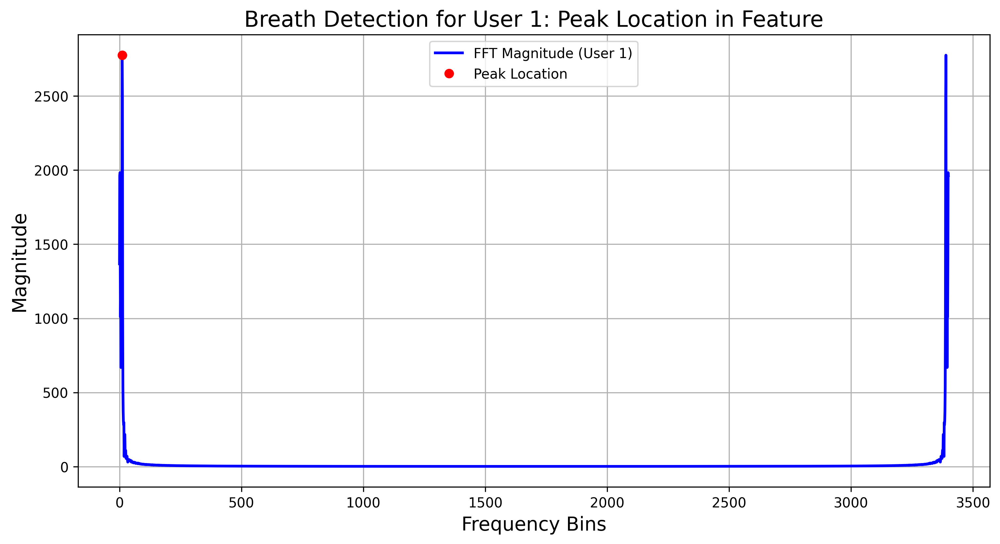

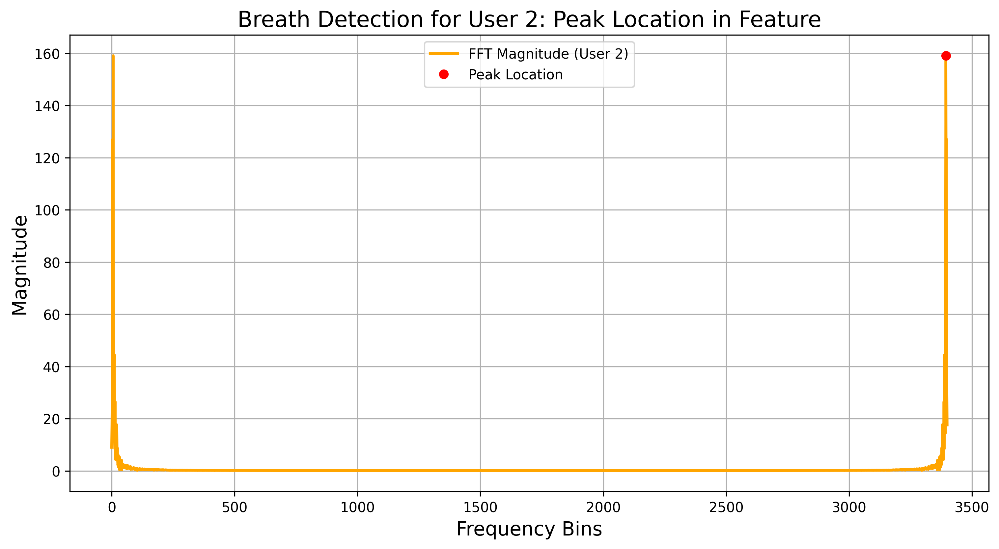

Estimated Breathing Rate User 1:  19.411764705882355 BPM
Estimated Breathing Rate User 2:  5989.411764705883 BPM


In [36]:
def BreathDetection(features):
    # Unpack the features
    feature_amplitude, feature_phase = features
    
    # For User 1: Using the amplitude feature
    max_value_1 = np.max(np.abs(feature_amplitude))
    arg_max_1 = np.argmax(np.abs(feature_amplitude))
    frequency_1 = arg_max_1 * (100 / len(feature_amplitude))  # Adjust based on the length
    estimated_breath_rate_1 = frequency_1 * 60  # Convert to BPM

    # For User 2: Using the phase feature
    max_value_2 = np.max(np.abs(feature_phase))
    arg_max_2 = np.argmax(np.abs(feature_phase))
    frequency_2 = arg_max_2 * (100 / len(feature_phase))  # Adjust based on the length
    estimated_breath_rate_2 = frequency_2 * 60  # Convert to BPM

    # Visualizing the location of peaks for User 1
    plt.figure(figsize=(12, 6), dpi=300)
    plt.plot(np.abs(feature_amplitude), label='FFT Magnitude (User 1)', color='blue', linewidth=2)
    plt.plot(arg_max_1, max_value_1, 'ro', label='Peak Location')
    plt.title('Breath Detection for User 1: Peak Location in Feature', fontsize=16)
    plt.xlabel('Frequency Bins', fontsize=14)
    plt.ylabel('Magnitude', fontsize=14)
    plt.legend()
    plt.grid(True)

    # Save the visualization
    plt.savefig(os.path.join(output_dir, 'breath_detection_user_1.png'), dpi=300, bbox_inches='tight')
    plt.show()

    # Visualizing the location of peaks for User 2
    plt.figure(figsize=(12, 6), dpi=300)
    plt.plot(np.abs(feature_phase), label='FFT Magnitude (User 2)', color='orange', linewidth=2)
    plt.plot(arg_max_2, max_value_2, 'ro', label='Peak Location')
    plt.title('Breath Detection for User 2: Peak Location in Feature', fontsize=16)
    plt.xlabel('Frequency Bins', fontsize=14)
    plt.ylabel('Magnitude', fontsize=14)
    plt.legend()
    plt.grid(True)

    # Save the visualization
    plt.savefig(os.path.join(output_dir, 'breath_detection_user_2.png'), dpi=300, bbox_inches='tight')
    plt.show()

    # Return the estimated breath rates for both users
    return estimated_breath_rate_1, estimated_breath_rate_2

# Call the BreathDetection function
estimated_rates = BreathDetection(features)
estimated_breath_rate_user_1, estimated_breath_rate_user_2 = estimated_rates
print("Estimated Breathing Rate User 1: ", estimated_breath_rate_user_1, "BPM")
print("Estimated Breathing Rate User 2: ", estimated_breath_rate_user_2, "BPM")


MSE for User 1:  16.083293800859238
MSE for User 2:  35630364.675432265


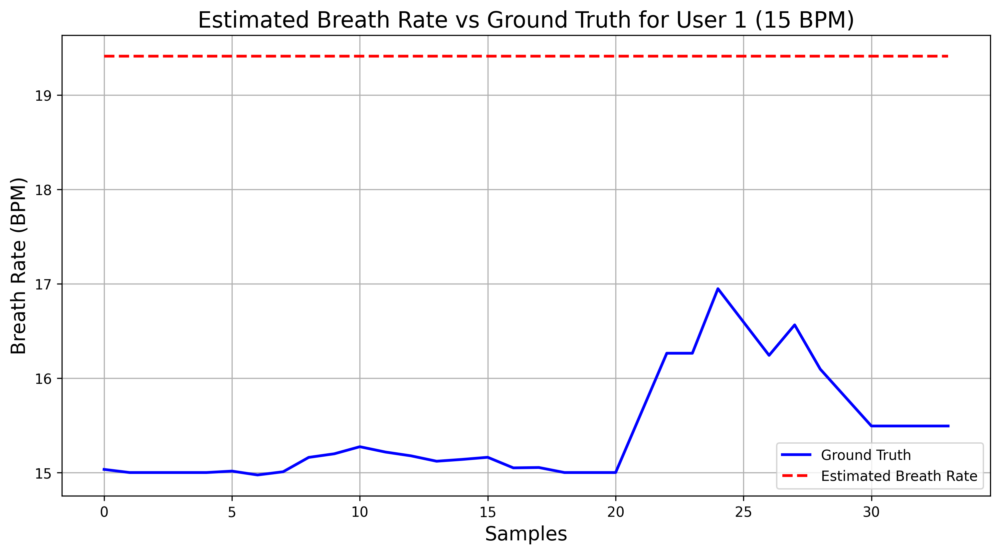

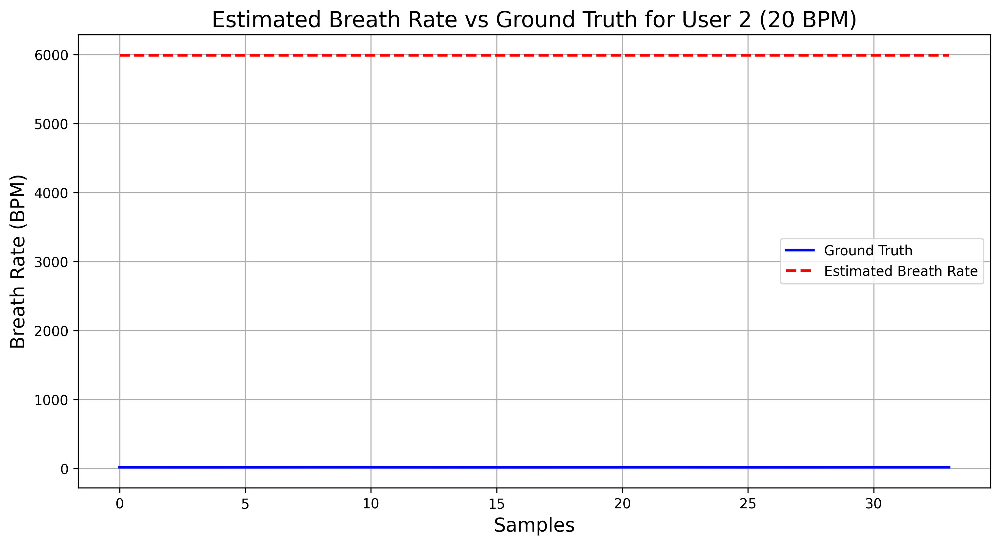

In [37]:
def up_down_sampling(result, l):
    """
    result: the series need to be up-sampled or down-sampled.
    l: the length of the return series.
    """
    # Up-sample or down-sample the result to match the length of the ground truth
    # Here we assume simple repetition for up-sampling
    if len(result) < l:  # Up-sampling
        return np.repeat(result, l // len(result) + 1)[:l]
    else:  # Down-sampling
        return result[:l]  # Just truncate

# Up-sample estimated rates for both users
final_result_user_1 = up_down_sampling([estimated_breath_rate_user_1], len(groundtruth[0]))
final_result_user_2 = up_down_sampling([estimated_breath_rate_user_2], len(groundtruth[1]))

def MSE(final_result, groundtruth):
    re = np.array(final_result)  # form list to numpy array
    gr = np.array(groundtruth)  # form list to numpy array
    return (np.sum((re - gr)**2)) / len(re)

# Calculate MSE for both users
mse_user_1 = MSE(final_result_user_1, groundtruth[0])
mse_user_2 = MSE(final_result_user_2, groundtruth[1])

print("MSE for User 1: ", mse_user_1)
print("MSE for User 2: ", mse_user_2)

# Visualization of Results
def result_visulization(groundtruth, final_result, user_label):
    plt.figure(figsize=(12, 6), dpi=300)
    plt.plot(groundtruth, label='Ground Truth', color='blue', linewidth=2)
    plt.plot(final_result, label='Estimated Breath Rate', color='red', linestyle='--', linewidth=2)
    plt.title(f'Estimated Breath Rate vs Ground Truth for {user_label}', fontsize=16)
    plt.xlabel('Samples', fontsize=14)
    plt.ylabel('Breath Rate (BPM)', fontsize=14)
    plt.legend()
    plt.grid(True)
    
    # Save the visualization
    output_path = os.path.join(output_dir, f'breath_rate_visualization_{user_label}.png')
    plt.savefig(output_path, dpi=300, bbox_inches='tight')  # Save at 300 DPI
    plt.show()

# Call the visualization function for both users
result_visulization(groundtruth[0], final_result_user_1, 'User 1 (15 BPM)')
result_visulization(groundtruth[1], final_result_user_2, 'User 2 (20 BPM)')


### 15-24 BPM case // Points: 2

In this part, you don't need to write code. You just need to run this part of the code to test the performance of the method you built in the above part in the 15-24 BPM case.

In [38]:
CSI = trainset['CSI'][7]  # the CSI series
groundtruth = trainset['groundtruth'][7]  # loading the ground-truth
experiment_name = trainset['ex_name'][7][:-4]
print("the name of this experiment: ", experiment_name)

the name of this experiment:  breath_bpm15-24_multiperson_ax200_cbw20_fs100_2x2_1_220928_174240


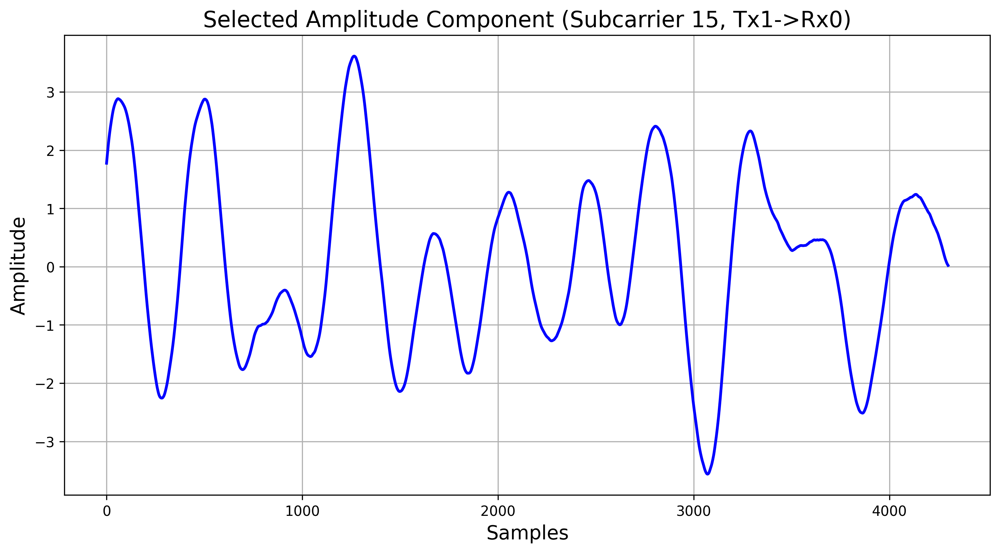

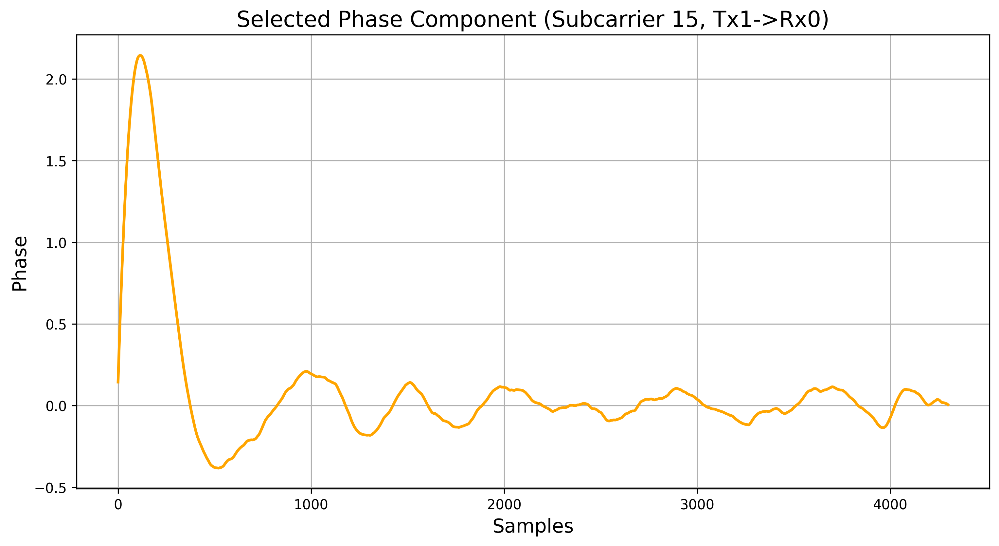

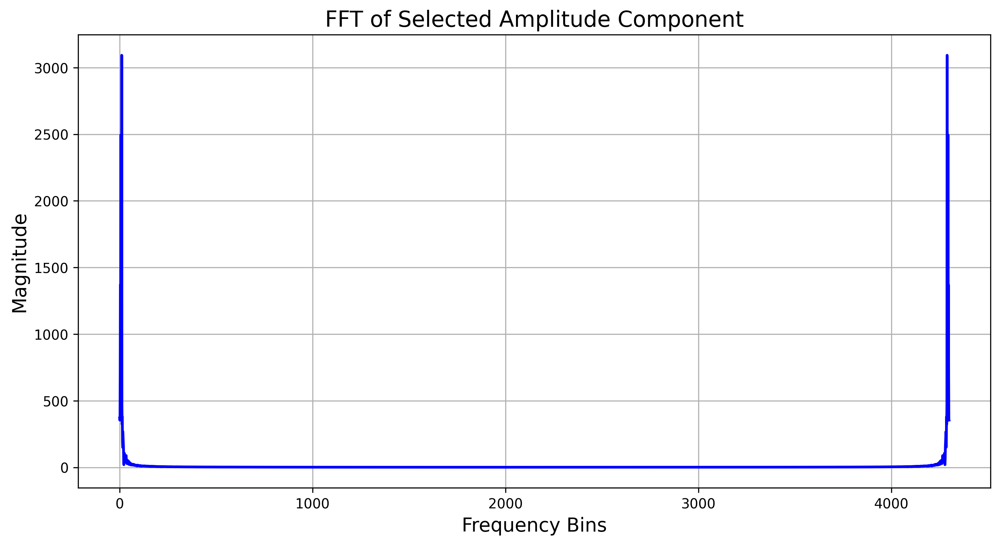

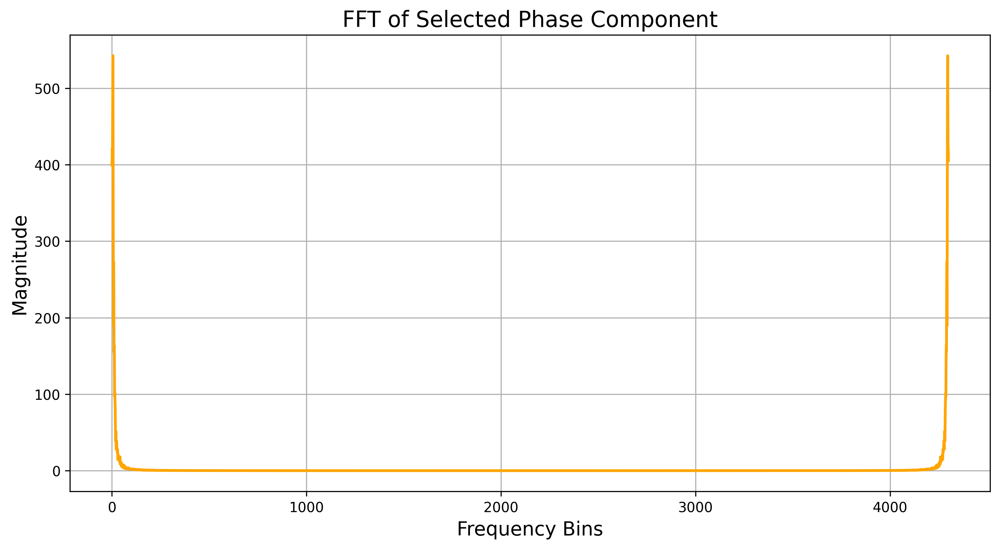

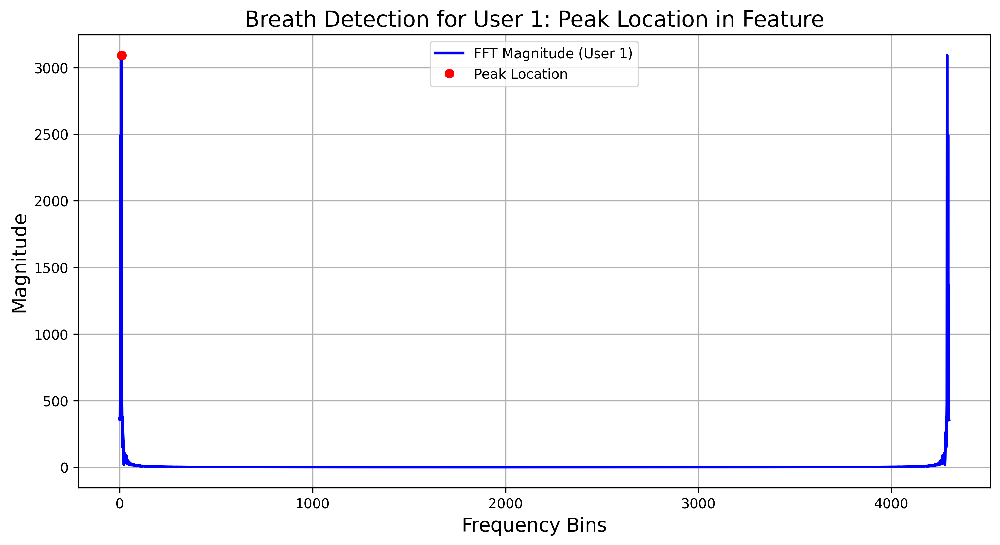

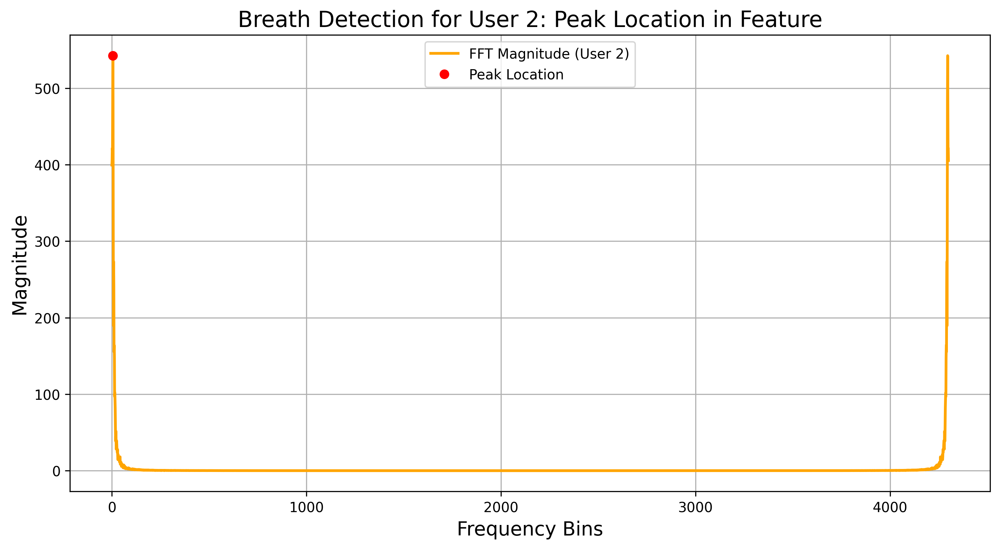

MSE-user1:  0.18514072433148274
MSE-user2:  278.2281124642008


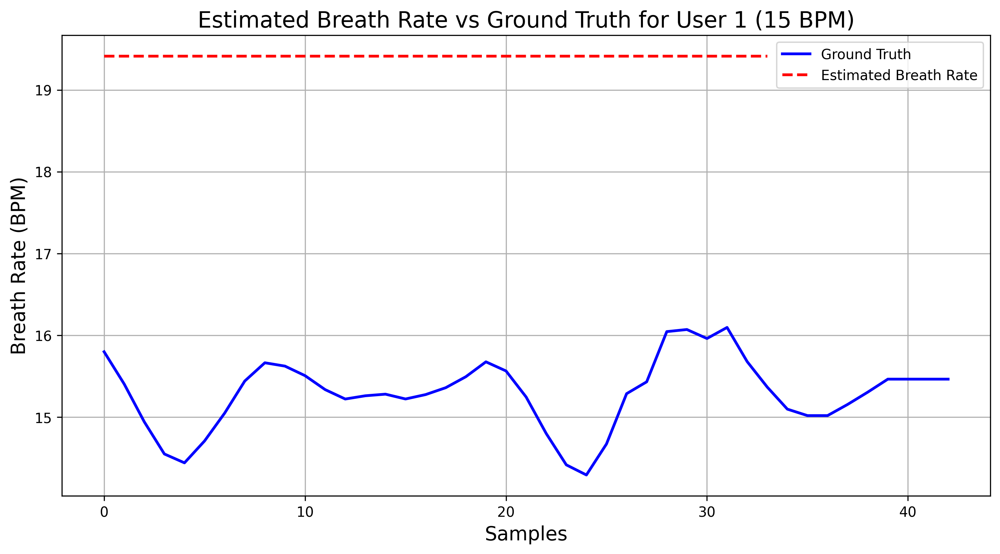

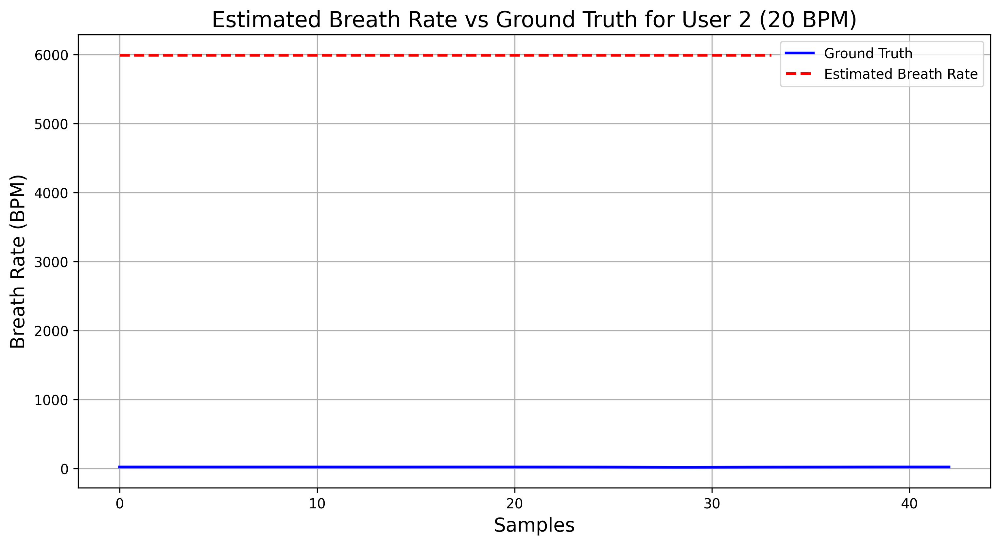

In [39]:
processed_CSI_amplitude, processed_CSI_phase = Preprocessing(CSI)
feature = FeatureDetection(processed_CSI_amplitude, processed_CSI_phase)
result_user1, result_user2 = BreathDetection(feature)
final_result_user1 = upsampling(result_user1, len(groundtruth[0]))
final_result_user2 = upsampling(result_user2, len(groundtruth[1]))
mse_user1 = MSE(final_result_user1, groundtruth[0])
mse_user2 = MSE(final_result_user2, groundtruth[1])
print("MSE-user1: ", mse_user1)
print("MSE-user2: ", mse_user2)
result_visulization(groundtruth[0], final_result_user_1, 'User 1 (15 BPM)')
result_visulization(groundtruth[1], final_result_user_2, 'User 2 (20 BPM)')


---
## Task3: Varied breath estimation (one person) // Points: 10

In this task, you need to build a method for estimating one user's breathing rate in varied mode. Specifically, <font color=red>there are two cases: </font>
    
- Case1: The experiment of one person with varied breath rates decreased from 24 BMP to 12 BMP (breath per minute).
- Case2: The experiment of one person with varied breath rates increased from 12 BMP to 24 BMP (breath per minute).

The method for this task is similar to the Task1 to some extent. However, since the breath rates are varied throughout the experiment, we need to utilize STFT (not FFT) to extract the features at different time.

You need to illustrate the building process of your method in the Case1. While only the result evaluation is needed in the Case2.

### Case1: // Points: 8

In [40]:
# Data for this task:
with open('Data/trainset.pickle', 'rb') as handle:
    trainset = pickle.load(handle)

CSI = trainset['CSI'][3]  # the CSI series
groundtruth = trainset['groundtruth'][3]  # loading the ground-truth
experiment_name = trainset['ex_name'][3][:-4]
print("the name of this experiment: ", experiment_name)

the name of this experiment:  breath_bpm24-12_ax200_cbw20_fs100_2x2_1_220928_172548


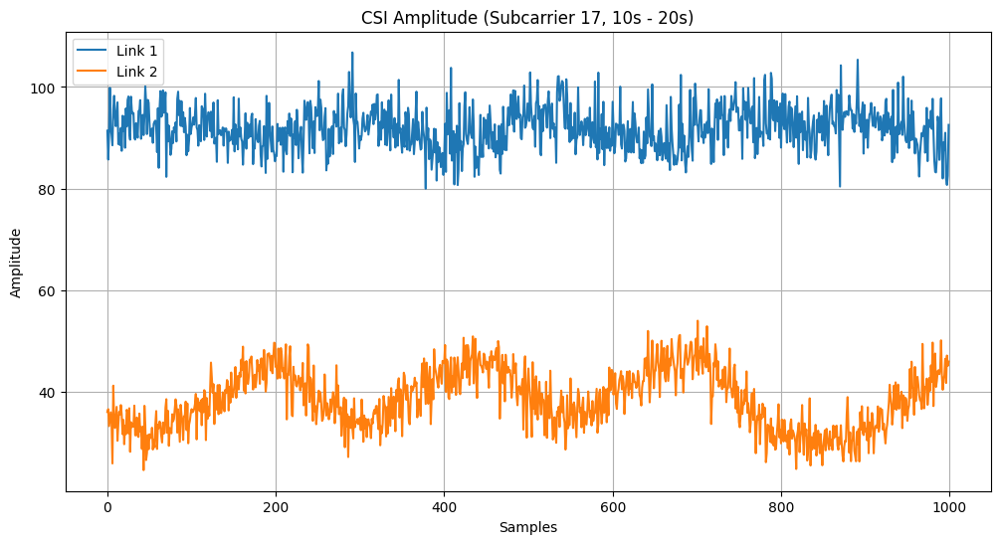

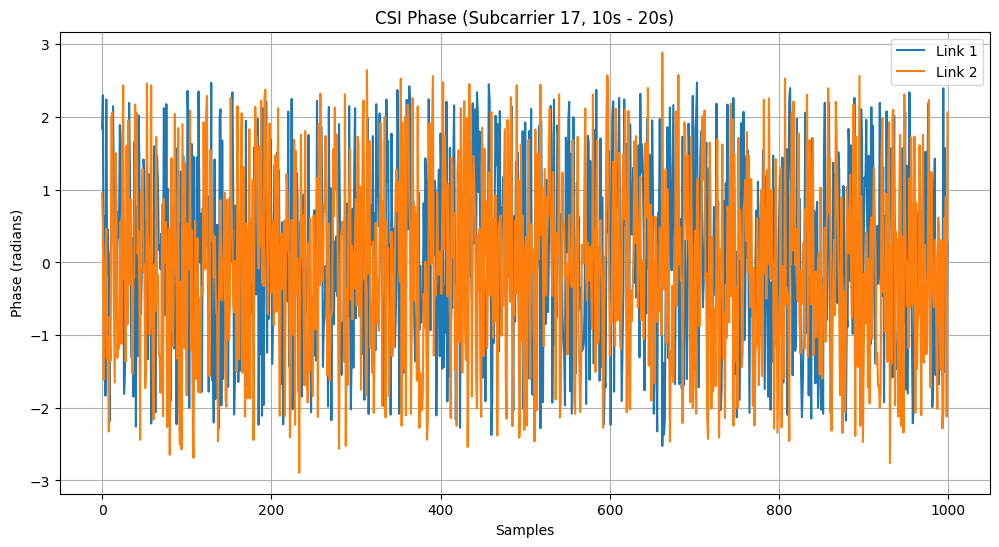

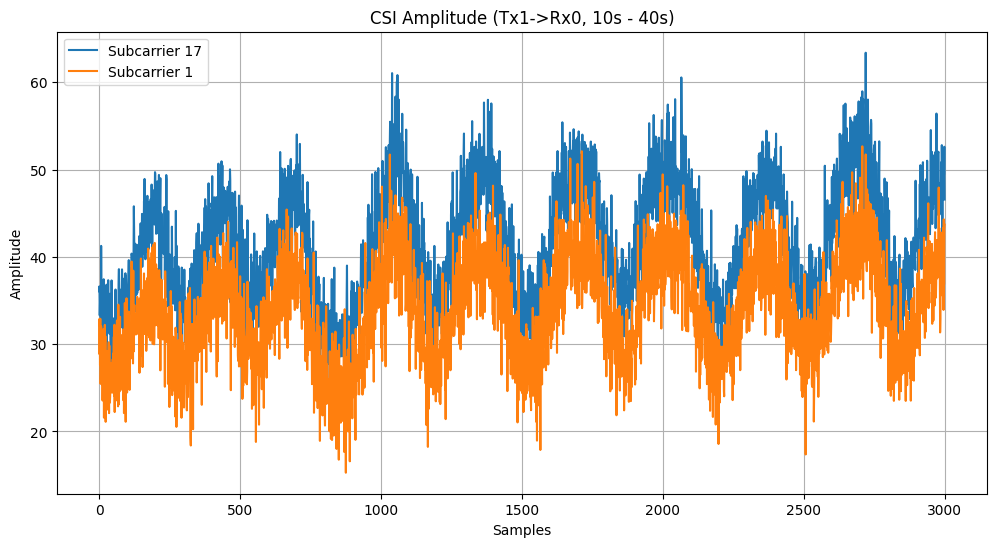

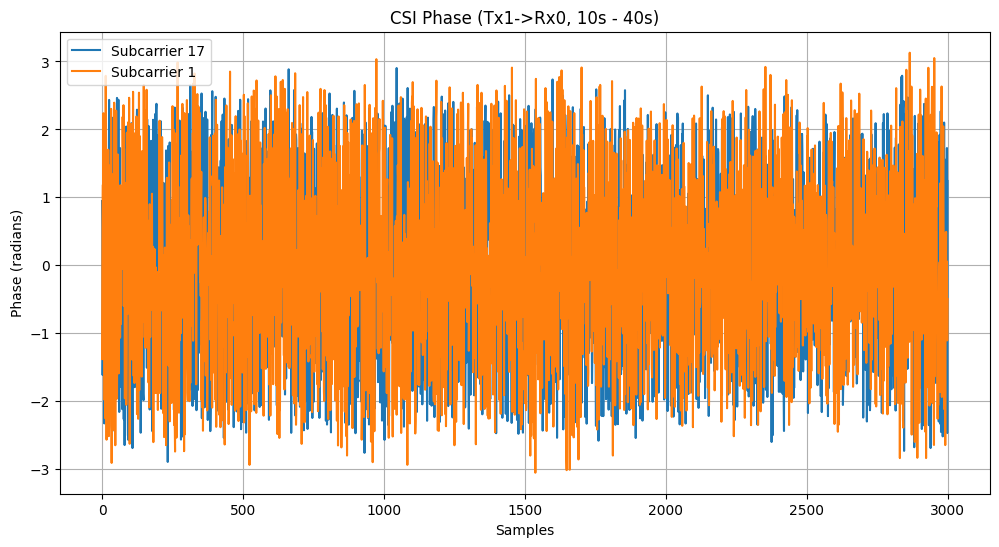

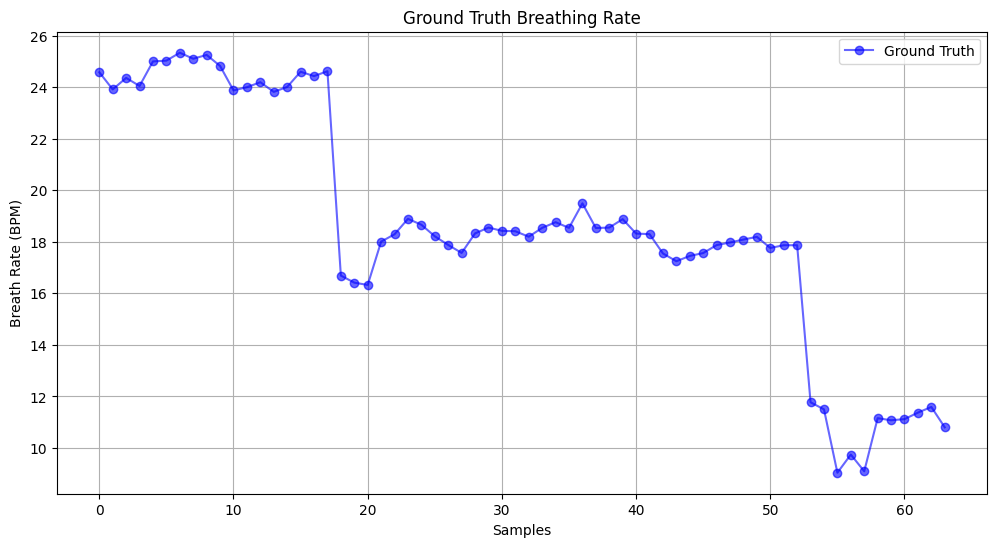

In [41]:
def DataVisualization(CSI, groundtruth):
    # STEP #1: Visualize the CSI from 10s - 20s on subcarrier #17 of all links
    time_range = slice(1000, 2000)  # 10s to 20s (100 samples per second)

    # 1.1: Visualize the amplitude
    plt.figure(figsize=(12, 6))
    for link in range(2):  # Loop through Tx-Rx pairs
        # Average over the two receiving antennas
        amplitude = np.mean(np.abs(CSI[time_range, 17, link, :]), axis=1)
        plt.plot(amplitude, label=f'Link {link + 1}')
    plt.title('CSI Amplitude (Subcarrier 17, 10s - 20s)')
    plt.xlabel('Samples')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid()
    plt.show()

    # 1.2: Visualize the phase
    plt.figure(figsize=(12, 6))
    for link in range(2):  # Loop through Tx-Rx pairs
        phase = np.mean(np.angle(CSI[time_range, 17, link, :]), axis=1)
        plt.plot(phase, label=f'Link {link + 1}')
    plt.title('CSI Phase (Subcarrier 17, 10s - 20s)')
    plt.xlabel('Samples')
    plt.ylabel('Phase (radians)')
    plt.legend()
    plt.grid()
    plt.show()

    # ==========================================================
    # STEP #2: Visualize the CSI from 10s - 40s on subcarrier #17 and #1 of the link (Tx1->Rx0)
    time_range_long = slice(1000, 4000)  # 10s to 40s

    # 2.1: Visualize the amplitude
    plt.figure(figsize=(12, 6))
    for subcarrier in [17, 1]:
        amplitude = np.mean(np.abs(CSI[time_range_long, subcarrier, 1, :]), axis=1)
        plt.plot(amplitude, label=f'Subcarrier {subcarrier}')
    plt.title('CSI Amplitude (Tx1->Rx0, 10s - 40s)')
    plt.xlabel('Samples')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid()
    plt.show()

    # 2.2: Visualize the phase
    plt.figure(figsize=(12, 6))
    for subcarrier in [17, 1]:
        phase = np.mean(np.angle(CSI[time_range_long, subcarrier, 1, :]), axis=1)
        plt.plot(phase, label=f'Subcarrier {subcarrier}')
    plt.title('CSI Phase (Tx1->Rx0, 10s - 40s)')
    plt.xlabel('Samples')
    plt.ylabel('Phase (radians)')
    plt.legend()
    plt.grid()
    plt.show()

    # =========================================================
    # STEP #3: Visualize the ground-truth
    plt.figure(figsize=(12, 6))
    plt.plot(groundtruth, marker='o', linestyle='-', color='blue', alpha=0.6, label='Ground Truth')
    plt.title('Ground Truth Breathing Rate')
    plt.xlabel('Samples')
    plt.ylabel('Breath Rate (BPM)')
    plt.legend()
    plt.grid()
    plt.show()

# Call the DataVisualization function
DataVisualization(CSI, groundtruth)


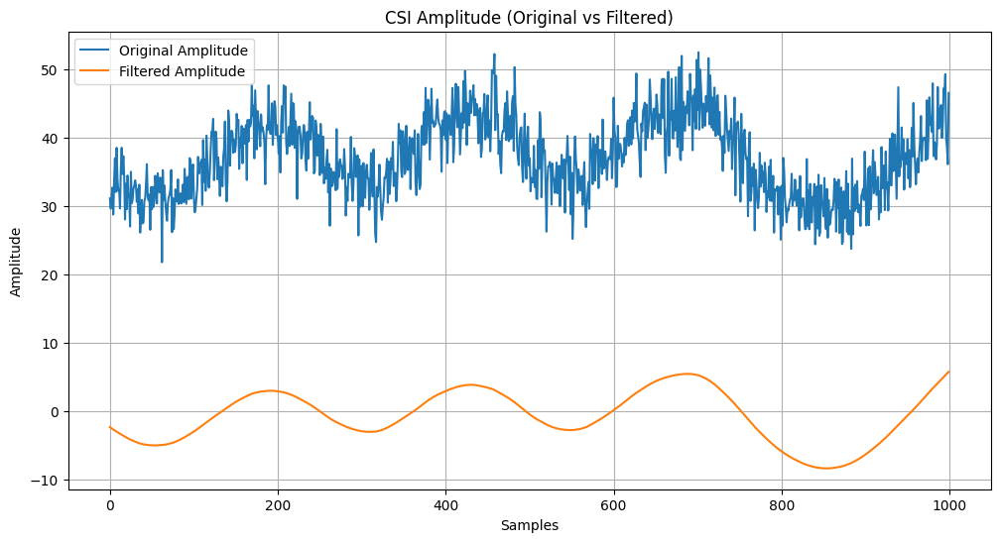

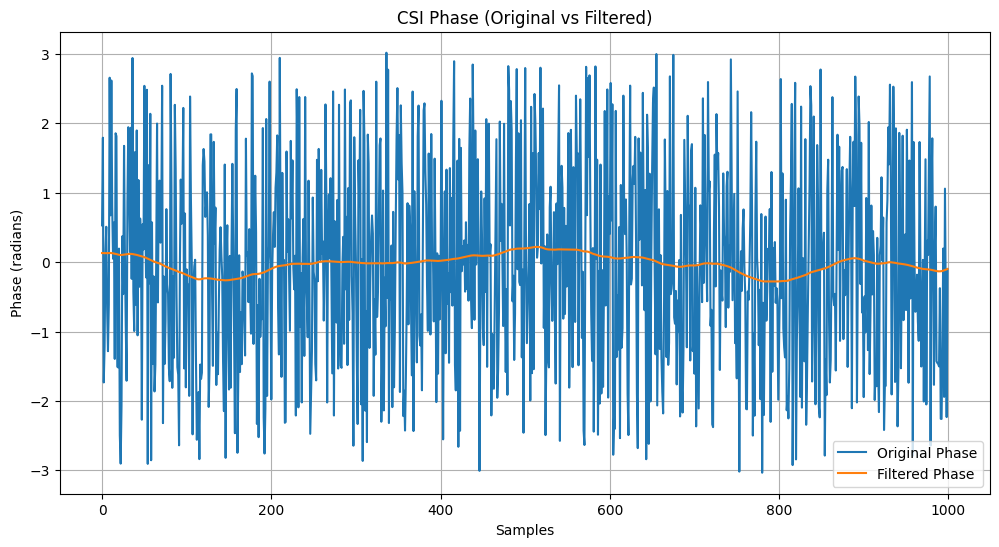

In [42]:
# Preprocessing
# You can use the same code from Task1. It would be better if you modified some of it to adapt to this task.

# Phase Cleaning
# the sanitization function is given to eliminate the phase offset
from cmath import pi


def sanitization(x):
    F = len(x)
    phase = np.angle(x)
    phase = np.unwrap(phase)
    a = (phase[-1] - phase[0]) / (2 * pi * F)
    b = sum(phase) / F

    firstpart = (np.arange(F) + 1) * a
    secondpart = np.ones(F) * b
    phase = phase - firstpart - secondpart

    return x * np.exp(1j * phase)


def phase_cleaning(CSI):
    for i in range(CSI.shape[0]):
        CSI[i, :, 0, 0] = sanitization(CSI[i, :, 0, 0])
        CSI[i, :, 0, 1] = sanitization(CSI[i, :, 0, 1])
        CSI[i, :, 1, 0] = sanitization(CSI[i, :, 1, 0])
        CSI[i, :, 1, 1] = sanitization(CSI[i, :, 1, 1])
    return CSI



from scipy import signal
import numpy as np
import matplotlib.pyplot as plt

def Preprocessing(CSI):
    # Step 1: Phase Cleaning
    CSI = phase_cleaning(CSI)

    # Step 2: Extract Amplitude and Phase
    CSI_amplitude = np.abs(CSI)
    CSI_phase = np.angle(CSI)

    # Step 3: Butterworth Bandpass Filter
    # Define filter parameters
    nyquist = 0.5 * 100  # Sampling frequency
    low = 0.1 / nyquist  # 0.1 Hz
    high = 0.5 / nyquist  # 0.5 Hz
    b, a = signal.butter(1, [low, high], btype='band')

    # Step 4: Filter Amplitude and Phase
    filtered_amplitude = signal.filtfilt(b, a, CSI_amplitude, axis=0)
    filtered_phase = signal.filtfilt(b, a, CSI_phase, axis=0)

    # Return denoised CSI as complex numbers
    # We combine amplitude and phase into one complex array
    processed_CSI = filtered_amplitude * np.exp(1j * filtered_phase)

    # Return only the filtered amplitude and phase
    return filtered_amplitude, filtered_phase

def visualize_denoising(original_CSI, filtered_CSI_amplitude, filtered_CSI_phase):
    time_range = slice(1000, 2000)  # 10s to 20s

    # Visualize Amplitude
    plt.figure(figsize=(12, 6))
    plt.plot(np.mean(np.abs(original_CSI[time_range, 12, 1, :]), axis=1), label='Original Amplitude')
    plt.plot(np.mean(filtered_CSI_amplitude[time_range, 12, 1, :], axis=1), label='Filtered Amplitude')
    plt.title('CSI Amplitude (Original vs Filtered)')
    plt.xlabel('Samples')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid()
    plt.show()

    # Visualize Phase
    plt.figure(figsize=(12, 6))
    plt.plot(np.mean(np.angle(original_CSI[time_range, 12, 1, :]), axis=1), label='Original Phase')
    plt.plot(np.mean(filtered_CSI_phase[time_range, 12, 1, :], axis=1), label='Filtered Phase')
    plt.title('CSI Phase (Original vs Filtered)')
    plt.xlabel('Samples')
    plt.ylabel('Phase (radians)')
    plt.legend()
    plt.grid()
    plt.show()

# Call Preprocessing and visualization
processed_CSI_amplitude, processed_CSI_phase = Preprocessing(CSI)
visualize_denoising(CSI, processed_CSI_amplitude, processed_CSI_phase)



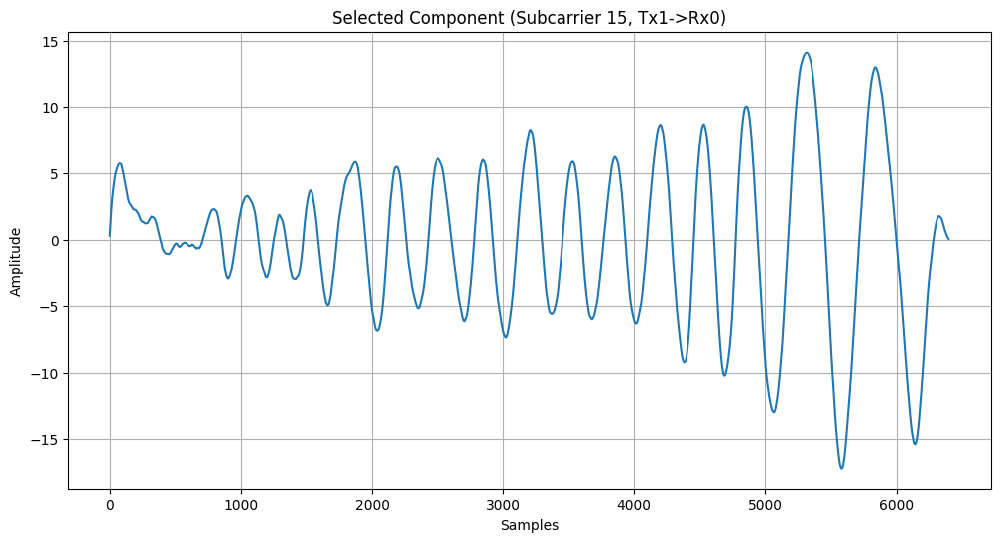

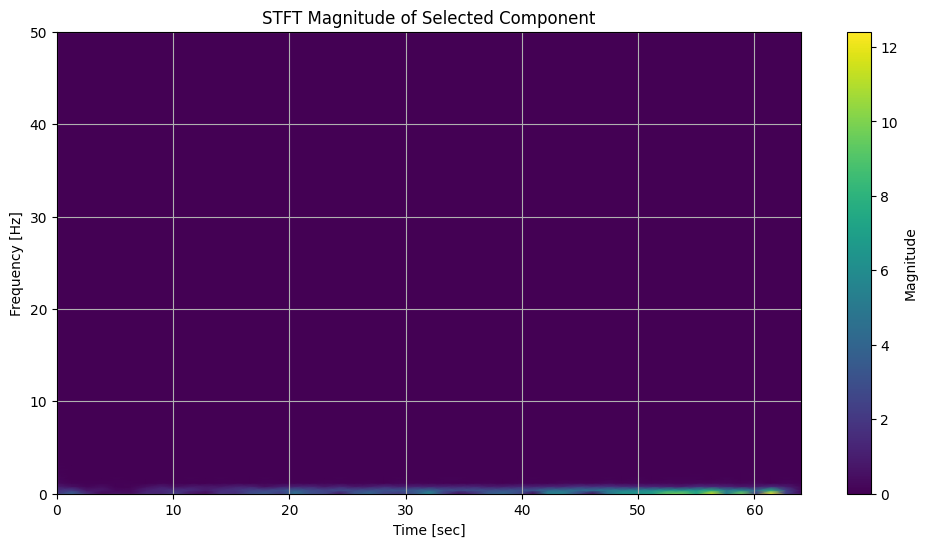

In [43]:
from scipy.signal import stft
import matplotlib.pyplot as plt

def FeatureDetection(processed_CSI_amplitude, processed_CSI_phase):
    # STEP #5: Selection of components
    selected_Rx = 0  # The selected Rx: 0 or 1
    selected_Tx = 1  # The selected Tx: 0 or 1
    selected_subcarrier = 15  # The selected subcarrier from 245 subcarriers

    # Select the amplitude component for STFT
    selected_component = processed_CSI_amplitude[:, selected_subcarrier, selected_Rx, selected_Tx]

    # 5.2: Visualize the selected component
    plt.figure(figsize=(12, 6))
    plt.plot(selected_component)
    plt.title(f'Selected Component (Subcarrier {selected_subcarrier}, Tx{selected_Tx}->Rx{selected_Rx})')
    plt.xlabel('Samples')
    plt.ylabel('Amplitude')
    plt.grid()
    plt.show()

    # =========================================================
    # STEP #6: Using STFT to extract the breath-related features
    # 6.1: Apply STFT on the selected component
    f, t, Zxx = stft(selected_component, fs=100, nperseg=256)  # Adjust nperseg based on your needs

    # 6.2: Visualize the STFT result
    plt.figure(figsize=(12, 6))
    plt.pcolormesh(t, f, np.abs(Zxx), shading='gouraud')
    plt.title('STFT Magnitude of Selected Component')
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.colorbar(label='Magnitude')
    plt.ylim(0, 50)  # Adjust frequency range based on expected breath rates
    plt.grid()
    plt.show()

    # Return the STFT result
    return Zxx

# Call the FeatureDetection function
feature = FeatureDetection(processed_CSI_amplitude, processed_CSI_phase)


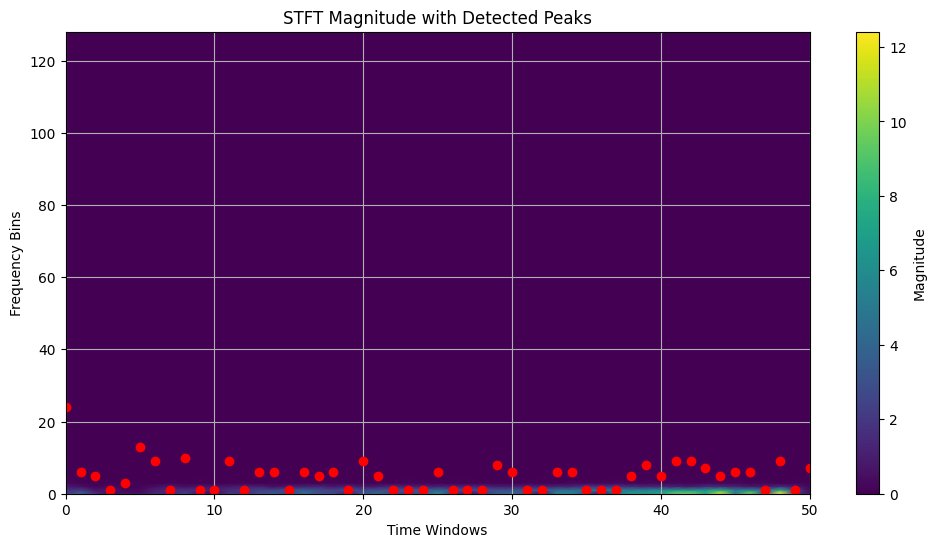

Estimated Breath Rates (BPM): [1116.279069767442, 279.0697674418605, 232.55813953488374, 46.51162790697675, 139.53488372093025, 604.6511627906976, 418.6046511627907, 46.51162790697675, 465.1162790697675, 46.51162790697675, 46.51162790697675, 418.6046511627907, 46.51162790697675, 279.0697674418605, 279.0697674418605, 46.51162790697675, 279.0697674418605, 232.55813953488374, 279.0697674418605, 46.51162790697675, 418.6046511627907, 232.55813953488374, 46.51162790697675, 46.51162790697675, 46.51162790697675, 279.0697674418605, 46.51162790697675, 46.51162790697675, 46.51162790697675, 372.093023255814, 279.0697674418605, 46.51162790697675, 46.51162790697675, 279.0697674418605, 279.0697674418605, 46.51162790697675, 46.51162790697675, 46.51162790697675, 232.55813953488374, 372.093023255814, 232.55813953488374, 418.6046511627907, 418.6046511627907, 325.58139534883725, 232.55813953488374, 279.0697674418605, 279.0697674418605, 46.51162790697675, 418.6046511627907, 46.51162790697675, 325.581395348

In [44]:
from scipy.signal import find_peaks

def BreathDetection(feature):
    # STEP #7: Find peaks in the STFT feature
    # 7.1: Find the maximum peaks in each time window (columns of the feature)
    peak_indices = []
    for i in range(feature.shape[1]):  # Iterate over time windows
        # Find peaks in the current time window
        peaks, _ = find_peaks(np.abs(feature[:, i]), height=0)  # Adjust height threshold if necessary
        if len(peaks) > 0:
            # Get the frequency of the peak
            peak_indices.append(peaks[np.argmax(np.abs(feature[peaks, i]))])  # Index of the highest peak
        else:
            peak_indices.append(None)  # No peak found

    # 7.2: Transform the locations of peaks to estimated breath rates (unit: BPM)
    # Assume that the sampling frequency is 100 Hz
    estimated_breath_rates = []
    for idx in peak_indices:
        if idx is not None:
            frequency = idx * (100 / feature.shape[0])  # Convert to Hz
            estimated_breath_rate = frequency * 60  # Convert to BPM
            estimated_breath_rates.append(estimated_breath_rate)
        else:
            estimated_breath_rates.append(None)  # No peak means no estimate

    # 7.3: Visualize the locations of peaks in the STFT feature
    plt.figure(figsize=(12, 6))
    plt.pcolormesh(np.abs(feature), shading='gouraud')
    plt.colorbar(label='Magnitude')
    plt.title('STFT Magnitude with Detected Peaks')
    plt.xlabel('Time Windows')
    plt.ylabel('Frequency Bins')
    
    # Overlay the peaks
    for i, peak in enumerate(peak_indices):
        if peak is not None:
            plt.plot(i, peak, 'ro')  # Plot peak locations as red circles

    plt.grid()
    plt.show()

    # Return the estimated breath rates
    return estimated_breath_rates

# Call the BreathDetection function
result = BreathDetection(feature)
print("Estimated Breath Rates (BPM):", result)


MSE:  71349.84116428303


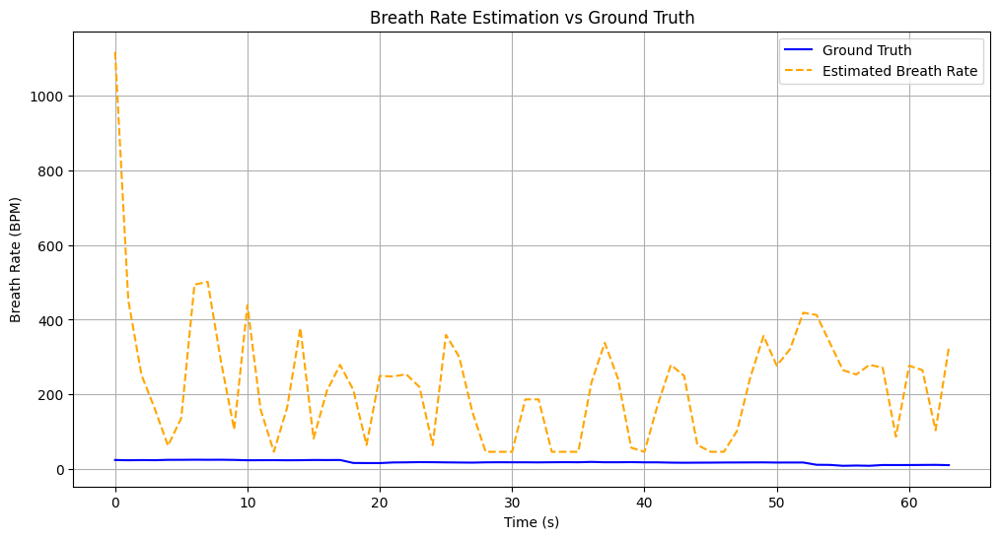

In [45]:
from scipy.interpolate import interp1d

def up_down_sampling(result, l):
    """
    result: the series need to be up-sampled or down-sampled.
    l: the length of the return series.
    """
    # Create a time axis for the original estimated results
    original_indices = np.arange(len(result))  # Indices of the original result
    new_indices = np.linspace(0, len(result) - 1, l)  # Indices for the new length

    # Interpolate the results to match the length of the groundtruth
    interpolation_func = interp1d(original_indices, result, kind='linear', fill_value='extrapolate')
    final_result = interpolation_func(new_indices)

    return final_result

# Up-sampling the estimated breath rate series
final_result = up_down_sampling(result, len(groundtruth))

# MSE Calculation
def MSE(final_result, groundtruth):
    re = np.array(final_result)  # Convert list to numpy array
    gr = np.array(groundtruth)    # Convert list to numpy array
    return np.mean((re - gr) ** 2)  # Calculate MSE

mse = MSE(final_result, groundtruth)
print("MSE: ", mse)

# Visualization Function
def result_visulization(groundtruth, final_result):
    plt.figure(figsize=(12, 6))
    time_axis = np.arange(len(groundtruth))  # Assuming groundtruth has the same time index
    plt.plot(time_axis, groundtruth, label='Ground Truth', color='blue')
    plt.plot(time_axis, final_result, label='Estimated Breath Rate', color='orange', linestyle='--')
    plt.title('Breath Rate Estimation vs Ground Truth')
    plt.xlabel('Time (s)')
    plt.ylabel('Breath Rate (BPM)')
    plt.legend()
    plt.grid()
    plt.savefig("Visualization/breath_rate_estimation.png", dpi=300, bbox_inches='tight')  # Save the figure
    plt.show()

# Call the visualization function
result_visulization(groundtruth, final_result)


### Case2: // Points: 2

In this part, you don't need to write code. You just need to run this part of the code to test the performance of the method you built in the above part in the Case2.

In [47]:
# Data for this task:
with open('Data/trainset.pickle', 'rb') as handle:
    trainset = pickle.load(handle)

CSI = trainset['CSI'][4]  # the CSI series
groundtruth = trainset['groundtruth'][4]  # loading the ground-truth
experiment_name = trainset['ex_name'][4][:-4]
print("the name of this experiment: ", experiment_name)

the name of this experiment:  breath_bpm12-24_ax200_cbw20_fs100_2x2_1_220928_171013


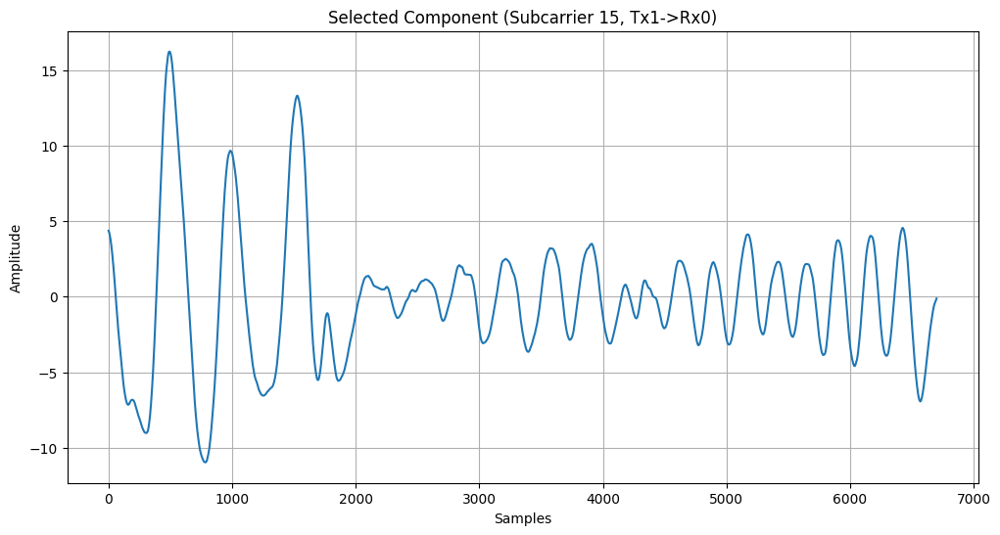

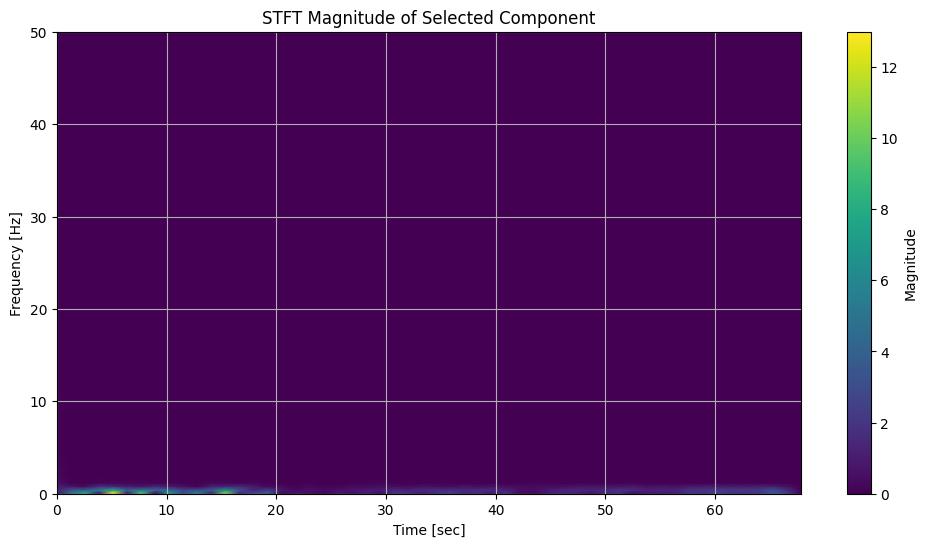

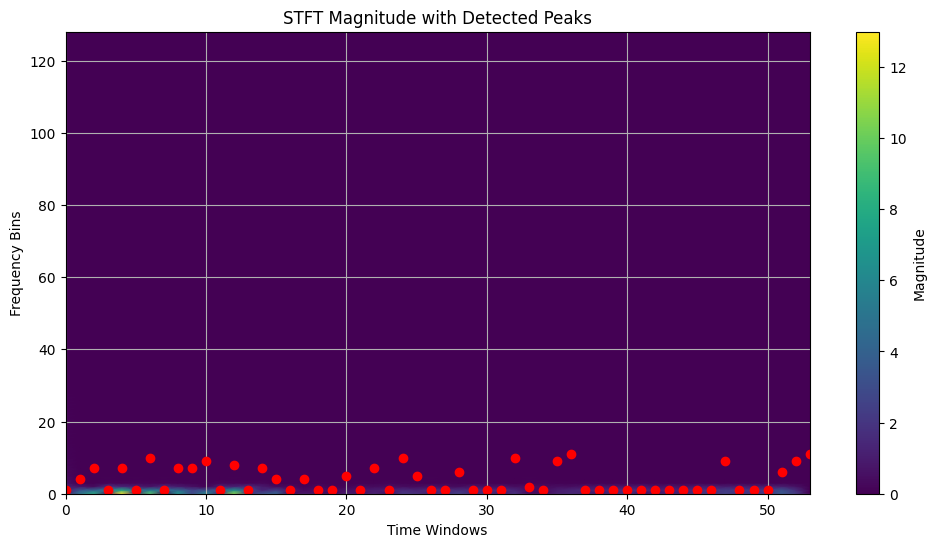

MSE:  41811.089511210484


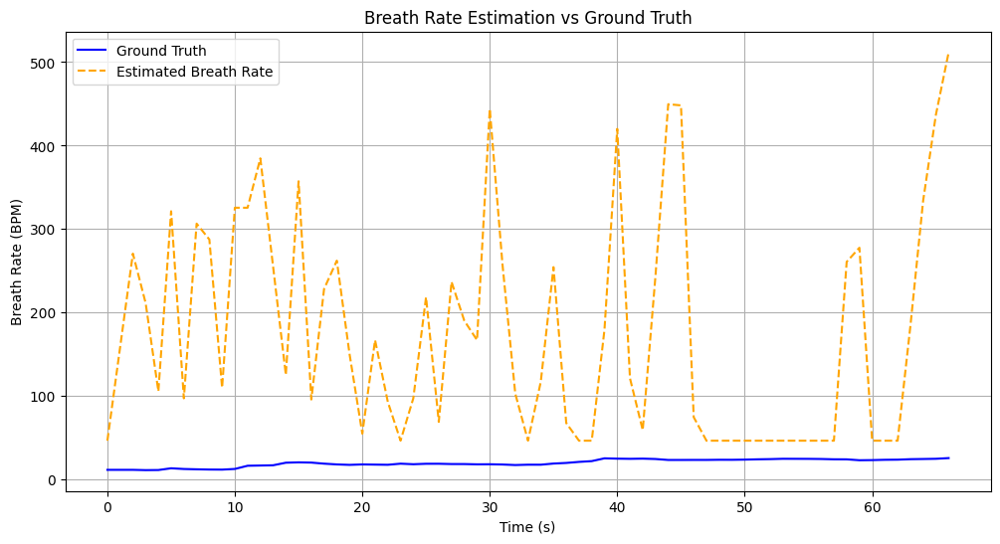

In [48]:
processed_CSI_amplitude, processed_CSI_phase = Preprocessing(CSI)
feature = FeatureDetection(processed_CSI_amplitude, processed_CSI_phase)
result = BreathDetection(feature)
final_result = up_down_sampling(result, len(groundtruth))
mse = MSE(final_result, groundtruth)
print("MSE: ", mse)
result_visulization(groundtruth, final_result)

---
## Advanced Task (Optional Bonus)

In this part, you need to build a method for estimating one user's breathing rate in varied mode. Specifically, <font color=red>The experiment of one person with varied breath rates increased from 12 BMP to 24 BMP, and then back to 12 BMP. </font>
New Things:
- we need to aggregate different subcarriers and links.
- The STFT will directly be used on the complexed CSI.

In [49]:
# Data for this part:
with open('trainset.pickle', 'rb') as handle:
    trainset = pickle.load(handle)

CSI = trainset['CSI'][5]  # the CSI series
groundtruth = trainset['groundtruth'][5]  # loading the ground-truth
experiment_name = trainset['ex_name'][5][:-4]
print("the name of this experiment: ", experiment_name)

FileNotFoundError: [Errno 2] No such file or directory: 'trainset.pickle'

In [50]:
# visualizing the CSI and ground-truth: reuse the code form Task1.


def DataVisualization(CSI, groundtruth):
    pass  # Please remove this line before beginning your work below.

    # STEP #1: Visualize the CSI from 10s - 20s on subcarrier #17 of all links
    # 1.1: Visualize the amplitude here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # 1.2: Visualize the phase here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # ==========================================================
    # STEP #2: Visualize the CSI from 10s - 40s on subcarrier #17 and #1 of the link (Tx1->Rx0)
    # 2.1: Visualize the amplitude here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # 2.2: Visualize the phase here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # =========================================================
    # STEP #3: Visualize the ground-truth here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # =========================================================
    # Hint: 1. From the result of STEP #1, you can observe the differences of CSI among the different links.
    #       2. From the result of STEP #2, you can observe the differences of CSI among the different subcarriers.
    #       3. From the result of STEP #3, you can observe the breath rate's time variation.


DataVisualization(CSI, groundtruth)

In [51]:
# Preprocessing

# Phase Cleaning
# the sanitization function is given to eliminate the phase offset
from cmath import pi


def sanitization(x):
    F = len(x)
    phase = np.angle(x)
    phase = np.unwrap(phase)
    a = (phase[-1] - phase[0]) / (2 * pi * F)
    b = sum(phase) / F

    firstpart = (np.arange(F) + 1) * a
    secondpart = np.ones(F) * b
    phase = phase - firstpart - secondpart

    return x * np.exp(1j * phase)


def phase_cleaning(CSI):
    for i in range(CSI.shape[0]):
        CSI[i, :, 0, 0] = sanitization(CSI[i, :, 0, 0])
        CSI[i, :, 0, 1] = sanitization(CSI[i, :, 0, 1])
        CSI[i, :, 1, 0] = sanitization(CSI[i, :, 1, 0])
        CSI[i, :, 1, 1] = sanitization(CSI[i, :, 1, 1])
    return CSI


def Preprocessing(CSI):
    CSI = phase_cleaning(CSI)  # phase cleaning
    CSI_amplitude = np.abs(CSI)  # the amplitude of CSI series
    CSI_phase = np.angle(CSI)  # the phase of CSI series
    pass  # Please remove this line before beginning your work below.

    # STEP #4: Using a filter (e.g., Butterworth filter) to process the CSI amplitude and phase.
    #          The goal of this step is to eliminate the unexpected variations of CSI,
    #          while keep the overall variations related to breath.
    # 4.1: Process the CSI amplitude here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # 4.2: Process the phase here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # 4.3: Visualize both the oringal CSI and denoised CSI from 10s - 20s on subcarrier #12 of the link (Tx1->Rx0)
    # 4.3.1: Visualize the amplitude here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # 4.3.2: Visualize the phase here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # !!!! Note: we need to return the complex CSI
    # Return processed_CSI_amplitude * exp(-j*processed_CSI_phase)


processed_CSI = Preprocessing(CSI)

In [52]:
# Feature Detection
# In this part, you need to use PCA (Principal Component Analysis to aggregate subcarriers and links)
# OR: you can use other method to fuse them.


def Aggregation(CSI):
    pass  # Please remove this line before beginning your work below.
    # STEP #5:
    # 5.1 links and subcarriers aggregation here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # 5.2: Visualize the aggregated CSI
    # 5.2.1: Visualize the amplitude here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # 5.2.2: Visualize the phase here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # return aggregated_CSI


aggregated_CSI = Aggregation(processed_CSI)


def FeatureDetection(aggregated_CSI):
    # STEP #6: Using STFT to extract the breath-related features
    # 6.1: Processing the selected_component here (code)
    # feature = ???
    # YOUR CODE HERE

    # END OF YOUR CODE

    # 6.2: Visulize the feature here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # !!!! Note: please return as follows:
    # Return feature
    pass  # Please remove this line before beginning your work.


feature = FeatureDetection(aggregated_CSI)

In [53]:
# breath detection: this block is different with those in the Task1 and Task2
#                   given that we use STFT for feature extraction in this task.
# The feature in this task is a 2-D map where the x-axis is time windows and the y-axis is frequency.
# You need to find the peak in different time windows. And the location of this peak is related to the
# user's breath rate in that time window. Hence, the below BreathDetection will return a series of the
# estimated breath rates.


def BreathDetection(feature):
    pass  # Please remove this line before beginning your work below.

    # STEP #7:
    # 7.1: Find the the peaks of all time window in feature (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # 7.2: Transform the locations of peaks to estimated breath rates (unit: BPM) here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # 7.3: Visulize the locations of peaks in the feature (2D-matrix version). (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # !!!! Note: please return the estimated breath rates as follows:
    # Return result


result = BreathDetection(feature)

In [54]:
# Now, you need to up-sampling or down-sampling the estimated breath rate series.
# This part is different with those in Task1 and Task2.
# Specifically, in Task1 and Task2, the breath rate is controlled
# that means we can use one scalar to represent the breath rate of one user throughout the experiment.
# However, in this task, by using the STFT, the 'result' is a series of estimated breath rate.
# You may need to either up-sample or down-sample it, that depends on the time window size you use in STFT.

# there are some online resources about the resample:
# - https://www.geeksforgeeks.org/how-to-resample-time-series-data-in-python/
# - https://machinelearningmastery.com/resample-interpolate-time-series-data-python/
# - https://www.kaggle.com/code/bhavinmoriya/upsampling-and-downsampling-of-time-series


def up_down_sampling(result, l):
    """
    result: the series need to be up-sampled or down-sampled.
    l: the length of the return series.
    """
    pass  # Please remove this line before beginning your work below.

    # STEP #8: up-sampling or down-sampling your result here (code)
    # YOUR CODE HERE

    # END OF YOUR CODE

    # Return final_result


final_result = up_down_sampling(result, len(groundtruth))


def MSE(final_result, groundtruth):
    re = np.array(final_result)  # form list to numpy array
    gr = np.array(groundtruth)  # form list to numpy array
    return (np.sum((re - gr)**2)) / len(re)


mse = MSE(final_result, groundtruth)

print("MSE: ", mse)


def result_visulization(groundtruth, final_result):
    pass  # Please remove this line before beginning your work below.
    # STEP #9: visulizing the estimated breath rate and ground-truth
    # YOUR CODE HERE

    # END OF YOUR CODE


result_visulization(groundtruth, final_result)

TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'